In [ ]:
import wcwidth
print("wcwidth is working ✅")


wcwidth is working ✅


In [ ]:
import os
import urllib.request 

if not os.path.exists("the-verdict.txt"):
    url = ("https://raw.githubusercontent.com/rasbt/"
           "LLMs-from-scratch/main/ch02/01_main-chapter-code/"
           "the-verdict.txt")
    file_path = "the-verdict.txt"
    urllib.request.urlretrieve(url, file_path)

In [ ]:
with open("the-verdict.txt", "r", encoding="utf-8" ) as f:
    raw_text = f.read()

In [ ]:
len(raw_text)

20479

Tokenization

In [ ]:
import re 

text = "Hello world, this is a test."
result = re.split(r'(\s)',text)

print(result)

['Hello', ' ', 'world,', ' ', 'this', ' ', 'is', ' ', 'a', ' ', 'test.']


In [ ]:
result = re.split(r'([,.]|\s)', text)

print(result)

['Hello', ' ', 'world', ',', '', ' ', 'this', ' ', 'is', ' ', 'a', ' ', 'test', '.', '']


In [ ]:
result = [item for item in result if item.strip()]
print(result)

['Hello', 'world', ',', 'this', 'is', 'a', 'test', '.']


In [ ]:
text = "hello world, this is -- a test?"

result = re.split(r'([,.:;?_!"()\']|--|\s)', raw_text)
result = [item.strip() for item in result if item.strip()]
print(result)
preprocessed = result

['I', 'HAD', 'always', 'thought', 'Jack', 'Gisburn', 'rather', 'a', 'cheap', 'genius', '--', 'though', 'a', 'good', 'fellow', 'enough', '--', 'so', 'it', 'was', 'no', 'great', 'surprise', 'to', 'me', 'to', 'hear', 'that', ',', 'in', 'the', 'height', 'of', 'his', 'glory', ',', 'he', 'had', 'dropped', 'his', 'painting', ',', 'married', 'a', 'rich', 'widow', ',', 'and', 'established', 'himself', 'in', 'a', 'villa', 'on', 'the', 'Riviera', '.', '(', 'Though', 'I', 'rather', 'thought', 'it', 'would', 'have', 'been', 'Rome', 'or', 'Florence', '.', ')', '"', 'The', 'height', 'of', 'his', 'glory', '"', '--', 'that', 'was', 'what', 'the', 'women', 'called', 'it', '.', 'I', 'can', 'hear', 'Mrs', '.', 'Gideon', 'Thwing', '--', 'his', 'last', 'Chicago', 'sitter', '--', 'deploring', 'his', 'unaccountable', 'abdication', '.', '"', 'Of', 'course', 'it', "'", 's', 'going', 'to', 'send', 'the', 'value', 'of', 'my', 'picture', "'", 'way', 'up', ';', 'but', 'I', 'don', "'", 't', 'think', 'of', 'that', ',

In [ ]:
len(preprocessed)

4690

In [ ]:
all_words = sorted(set(preprocessed))  # this removes the duplicates and arranges them in order
vocab_size = len(all_words)
print(vocab_size)

1130


In [ ]:
print(all_words)

['!', '"', "'", '(', ')', ',', '--', '.', ':', ';', '?', 'A', 'Ah', 'Among', 'And', 'Are', 'Arrt', 'As', 'At', 'Be', 'Begin', 'Burlington', 'But', 'By', 'Carlo', 'Chicago', 'Claude', 'Come', 'Croft', 'Destroyed', 'Devonshire', 'Don', 'Dubarry', 'Emperors', 'Florence', 'For', 'Gallery', 'Gideon', 'Gisburn', 'Gisburns', 'Grafton', 'Greek', 'Grindle', 'Grindles', 'HAD', 'Had', 'Hang', 'Has', 'He', 'Her', 'Hermia', 'His', 'How', 'I', 'If', 'In', 'It', 'Jack', 'Jove', 'Just', 'Lord', 'Made', 'Miss', 'Money', 'Monte', 'Moon-dancers', 'Mr', 'Mrs', 'My', 'Never', 'No', 'Now', 'Nutley', 'Of', 'Oh', 'On', 'Once', 'Only', 'Or', 'Perhaps', 'Poor', 'Professional', 'Renaissance', 'Rickham', 'Riviera', 'Rome', 'Russian', 'Sevres', 'She', 'Stroud', 'Strouds', 'Suddenly', 'That', 'The', 'Then', 'There', 'They', 'This', 'Those', 'Though', 'Thwing', 'Thwings', 'To', 'Usually', 'Venetian', 'Victor', 'Was', 'We', 'Well', 'What', 'When', 'Why', 'Yes', 'You', '_', 'a', 'abdication', 'able', 'about', 'above',

In [ ]:
preprocessed[:20]

['I',
 'HAD',
 'always',
 'thought',
 'Jack',
 'Gisburn',
 'rather',
 'a',
 'cheap',
 'genius',
 '--',
 'though',
 'a',
 'good',
 'fellow',
 'enough',
 '--',
 'so',
 'it',
 'was']

Enumerate(all_words) loops over all_words, giving both the index and the value 
Example code :


In [ ]:
# all_words = ['.', 'hello', 'world']
# for integer, token in enumerate(all_words):
#     print(integer, token)

In [ ]:
vocab = {token: integer for integer, token in enumerate(all_words)}

In [ ]:
for i, item in enumerate(vocab.items()):
    print(i ,item)
    if i >= 50:
        break

0 ('!', 0)
1 ('"', 1)
2 ("'", 2)
3 ('(', 3)
4 (')', 4)
5 (',', 5)
6 ('--', 6)
7 ('.', 7)
8 (':', 8)
9 (';', 9)
10 ('?', 10)
11 ('A', 11)
12 ('Ah', 12)
13 ('Among', 13)
14 ('And', 14)
15 ('Are', 15)
16 ('Arrt', 16)
17 ('As', 17)
18 ('At', 18)
19 ('Be', 19)
20 ('Begin', 20)
21 ('Burlington', 21)
22 ('But', 22)
23 ('By', 23)
24 ('Carlo', 24)
25 ('Chicago', 25)
26 ('Claude', 26)
27 ('Come', 27)
28 ('Croft', 28)
29 ('Destroyed', 29)
30 ('Devonshire', 30)
31 ('Don', 31)
32 ('Dubarry', 32)
33 ('Emperors', 33)
34 ('Florence', 34)
35 ('For', 35)
36 ('Gallery', 36)
37 ('Gideon', 37)
38 ('Gisburn', 38)
39 ('Gisburns', 39)
40 ('Grafton', 40)
41 ('Greek', 41)
42 ('Grindle', 42)
43 ('Grindles', 43)
44 ('HAD', 44)
45 ('Had', 45)
46 ('Hang', 46)
47 ('Has', 47)
48 ('He', 48)
49 ('Her', 49)
50 ('Hermia', 50)


In [ ]:
#str to int 
vocab["Jack"]

57

In [ ]:
inverse_vocab = {integer: token for integer, token in enumerate(all_words)}#int to str
inverse_vocab[57]

'Jack'

In [ ]:
for i,item in enumerate(inverse_vocab.items()):
    print( item)
    if i>=50:
        break

(0, '!')
(1, '"')
(2, "'")
(3, '(')
(4, ')')
(5, ',')
(6, '--')
(7, '.')
(8, ':')
(9, ';')
(10, '?')
(11, 'A')
(12, 'Ah')
(13, 'Among')
(14, 'And')
(15, 'Are')
(16, 'Arrt')
(17, 'As')
(18, 'At')
(19, 'Be')
(20, 'Begin')
(21, 'Burlington')
(22, 'But')
(23, 'By')
(24, 'Carlo')
(25, 'Chicago')
(26, 'Claude')
(27, 'Come')
(28, 'Croft')
(29, 'Destroyed')
(30, 'Devonshire')
(31, 'Don')
(32, 'Dubarry')
(33, 'Emperors')
(34, 'Florence')
(35, 'For')
(36, 'Gallery')
(37, 'Gideon')
(38, 'Gisburn')
(39, 'Gisburns')
(40, 'Grafton')
(41, 'Greek')
(42, 'Grindle')
(43, 'Grindles')
(44, 'HAD')
(45, 'Had')
(46, 'Hang')
(47, 'Has')
(48, 'He')
(49, 'Her')
(50, 'Hermia')


In [ ]:
# int  to str
inverse_vocab[57]

'Jack'

Implementing an class for tokeneizer:
The class will have an encode method that splits text into tokens and map those token to TokenID from the vocabolary 
also there is an decode method which carries out an inverse tokenIDs to string mapping to convert tokens into text 

Step 1: Store the vocabolary and inverse vocabolary as class atribute for access in the encode and decode methods
Step 2: (encode) Process intput text into tokensIDs
Step 3: (decode) process token IDs back to text
Step 4: replace the spaces before specifed punctuatio s.

In [ ]:
class SimpleTokenizerV1:
    def __init__ (self, vocab, inverse_vocab):
        self.str_to_int = vocab
        self.int_to_str = inverse_vocab
    def encode(self, text):
        preprocessed = re.split(r'([,.:;?_!"()\']|--|\s)', text)

        preprocessed = [item.strip() for item in preprocessed if item.strip()]

        ids = [self.str_to_int[item] for item in preprocessed]  #out of the vocabolary cases give error
        return ids
    def decode(self, ids):
        text = " ".join([self.int_to_str[id] for id in ids])
        # Replace spaces before the specified punctuations 
        text = re.sub(r'\s+([,.?"()\'])', r'\1', text)
        return text
    

now lets tokenize some text from that short story using our simple tokenizer V1 

In [ ]:
tokenizer = SimpleTokenizerV1(vocab , inverse_vocab)
text = """"It's the last he painted, you know," 
           Mrs. Gisburn said with pardonable pride."""
ids = tokenizer.encode(text)
print(ids)

[1, 56, 2, 850, 988, 602, 533, 746, 5, 1126, 596, 5, 1, 67, 7, 38, 851, 1108, 754, 793, 7]


In [ ]:
tokenizer.decode(ids)

'" It\' s the last he painted, you know," Mrs. Gisburn said with pardonable pride.'

In [ ]:
text = "Hello world, this is a test."
print(tokenizer.encode(text))

KeyError: 'Hello'

In [ ]:
all_tokens = sorted(list(set(preprocessed))) # converting to list and sorting 
all_tokens.extend(["<|endoftext|>", "<|unk|>"]) # adding special tokens to vocab

vocab = {token: integer for integer, token in enumerate(all_tokens)}

In [ ]:
len(vocab.items())

1132

now we also have to add special token to inverse vocab too

In [ ]:
len(inverse_vocab.items())

1130

In [ ]:
inverse_vocab = {integer: token for integer, token in enumerate(all_tokens)}

In [ ]:
len(inverse_vocab)

1132

lets check last 5 items in inverse vocabolary 

In [ ]:
for i,item in enumerate(list(inverse_vocab.items())[-5:]):
    print(item)

(1127, 'younger')
(1128, 'your')
(1129, 'yourself')
(1130, '<|endoftext|>')
(1131, '<|unk|>')


lets check last 5 items in our vocabolary 

In [ ]:
for i, item in enumerate(list(vocab.items())[-5:]):
    print(item)


('younger', 1127)
('your', 1128)
('yourself', 1129)
('<|endoftext|>', 1130)
('<|unk|>', 1131)


Simple tokenizer V2
1> Replace unkown words with <|unk|> character 

In [ ]:
class SimpleTokenizerV2:
    def __init__ (self, vocab, inverse_vocab):
        self.str_to_int = vocab
        self.int_to_str = inverse_vocab
    
    def encode(self, text):
        preprocessed = re.split(r'([,.:;?_!"()\']|--|\s)', text)
        preprocessed = [item.strip() for item in preprocessed if item.strip()]
        preprocessed = [
            item if item in self.str_to_int
            else "<|unk|>" for item in preprocessed 
        ]

        ids = [self.str_to_int[s] for s in preprocessed] 
        return ids
    
    def decode(self, text):
        text = " ".join([self.int_to_str[id] for id in text])
        text = re.sub(r'\s+([,.?"()\'])', r'\1', text)
        return text



In [ ]:
tokenizer = SimpleTokenizerV2(vocab , inverse_vocab)
text1 = "Hello, do you like tea?"
text2 = "In the sunlit terraces of the palace."

text = "<|endoftext|>".join([text1, text2])
print(text)

Hello, do you like tea?<|endoftext|>In the sunlit terraces of the palace.


In [ ]:
tokenizer.encode(text)

[1131, 5, 355, 1126, 628, 975, 10, 1131, 988, 956, 984, 722, 988, 1131, 7]

In [ ]:
tokenizer.decode(tokenizer.encode(text))

'<|unk|>, do you like tea? <|unk|> the sunlit terraces of the <|unk|>.'

BytePair Encoding 

In [ ]:
import importlib
import tiktoken

print("tiktoken version:", importlib.metadata.version("tiktoken"))

tiktoken version: 0.11.0


initializing the byte pair encoder form tiktoken

In [ ]:
tokenizer = tiktoken.get_encoding("gpt2")

In [ ]:
text = (
    "Hello, do you like tea? <|endoftext|> In the sunlit terraces"
     "of someunknownPlace."
)

integers = tokenizer.encode(text, allowed_special={"<|endoftext|>"})
print(integers)

[15496, 11, 466, 345, 588, 8887, 30, 220, 50256, 554, 262, 4252, 18250, 8812, 2114, 1659, 617, 34680, 27271, 13]


In [ ]:
string = tokenizer.decode(integers)
print(string)

Hello, do you like tea? <|endoftext|> In the sunlit terracesof someunknownPlace.


Example to demonstrate how an BPE toknizer breaks unkown text

In [ ]:
integer = tokenizer.encode("Akwirw ier")
print(integer)

string = tokenizer.decode(integer)
print(string)

[33901, 86, 343, 86, 220, 959]
Akwirw ier


In [ ]:
import tiktoken

#initializing the encoding for gpt-2 , gpt-3 and gpt-4
encodings = {
    "gpt2" : tiktoken.get_encoding("gpt2"),
    "gpt3" : tiktoken.get_encoding("p50k_base"), # 50k tokens 
    "gpt4" : tiktoken.get_encoding("cl100k_base") # 100k tokens
    }

# get the vocabolary size for each encoding 
vocab_sizes = {model: encoding.n_vocab for model, encoding in encodings.items()} # n_vocab is the total number of unique tokens in the vocab

for model, size in vocab_sizes.items():
    print(f"The vocab size for {model} is : {size} tokens.")

The vocab size for gpt2 is : 50257 tokens.
The vocab size for gpt3 is : 50281 tokens.
The vocab size for gpt4 is : 100277 tokens.


Data Sampling with a Sliding window 

Creating input Target pairs 

implementing a data loader that fetches input target pairs using sliding window approach 

In [ ]:
with open("the-verdict.txt", "r", encoding="utf-8") as f:  #opens the text file name the-verdict.txt in read mode with utf-8 encoding 
    raw_text = f.read()                                    #with ...as f: ensures that the file is automaticall closed after the bloack is finished 

enc_text = tokenizer.encode(raw_text)
print(len(enc_text))

5145


-> For each text chunk, we want the inputs and the targets 
-> since we want the model to predict the next word, the targets are the inputs and shifted by one position to the right 

removing the first 50 tokens from the the dataset for demonstration purposes

In [ ]:
enc_sample = enc_text[50:]

creating input target pair for next word prediction task is to create two variables x and y where x contains the input tokens and y contains the targets, which are input shifted by 1:

In [ ]:
context_size = 4 # lenght of the input 

#the context size of 4 means that the model will look at the previous 4 tokens to predict the next token 
# input x is the first 4 tokens [1,2,3,4] and target y is the next 4 tokens [2,3,4,5]

x = enc_sample[:context_size] #first 4 tokens
y = enc_sample[1:context_size + 1] # next 4 tokens shifted to the right by 1 

print(f"x: {x}")
print(f"y:      {y}")

x: [290, 4920, 2241, 287]
y:      [4920, 2241, 287, 257]


one by one prediction will look like as follows 

In [ ]:
for i in range(1, context_size + 1):
    context = enc_sample[:i]
    desired = enc_sample[i]

    print(context, "---->", desired)


[290] ----> 4920
[290, 4920] ----> 2241
[290, 4920, 2241] ----> 287
[290, 4920, 2241, 287] ----> 257


In [ ]:
print(enc_sample[:1])
print(enc_sample[1])

[290]
4920


lets convert tokenIDs into text 

In [ ]:
for i in range(1, context_size + 1):
    context = enc_sample[:i]
    desired = enc_sample[i]

    print(tokenizer.decode(context), "---->", tokenizer.decode([desired])) #tokenizer.decode expects a list integer but we have single integer so we put it in a list 

 and ---->  established
 and established ---->  himself
 and established himself ---->  in
 and established himself in ---->  a


implementing an simple data loader that iterates over the input dataset and returns the inputs and targets shifted by one

In [ ]:
import torch
print(torch.__version__)

2.5.1


and the returned imputs and targets and in the form of pytorch tensors which can be thought of as multidimensional arrays

for efficent data loader implementation 
we will use Pytorch's built in dataset and dataloader Classes

GPTDatasetV1 steps:
1> Tokenize the entire text
2> Use the Sliding window to chunk the book in to overlapping sequences of max_length
3> Return the total number of row in the dataset
4> return a single row form the dataset

## Dataset class in pytorch. (It is an ABSTRACT CLASS in pytorch)

An Abstract class is an class which cannot be instantiated on its own and is designed to be an blueprint for other class.(Example below)

Dataset class is essentially a blueprint. when you create a custom Dataset, you decide how data is loaded and returned.

1-> init() ---> which tells how dataset shoud be loaded. (Constructor)
2-> __len__() ---> which returns the total number of samples.
3-> __getitem__(index) ---> which returns the data (and label) at the given index.

In [ ]:
#abstract class example 
# from abc import ABC, abstractmethod
# class Animal(ABC):
#     @abstractmethod
#     def sound(self):
#         pass
# class Dog(Animal):
#     def sound(self):
#         return "bark"
    
# dog = Dog()
# print(dog.sound())

In [ ]:
# dataset for batched imputs and targets
from torch.utils.data import Dataset , DataLoader


class GPTDatasetV1(Dataset):
    def __init__(self, txt, tokenizer, max_length, stride):   # stride is how far we move the sliding window each step
        
        self.input_ids = [] #input sequence for the model
        self.target_ids = [] #target sequnece (what the model should predict)

        #Tokenize the entire text 
        token_ids = tokenizer.encode(txt, allowed_special={"<|endoftext|>"})
        assert len(token_ids) > max_length, "The numebr of tokenized inputs must atleast be equal to max_length+1" #assert is an keyword that raises an error if the condition is false 

        #use a sliding window appraoch to chunk the book into overlapping sequence of max_lenghth
        for i in range(0, len(token_ids) - max_length, stride):# range(start, stop , step)

            input_chunk = token_ids [i :i + max_length] #the sequence that model see.  (Takes max_length tokens starting at i)
            target_chunk = token_ids[i + 1 : i + max_length + 1] #the sequence that model must predict (same as input_chunk but shifted by 1)

            self.input_ids.append(torch.tensor(input_chunk))  #converting list into pytorch tensor using .appened method
            self.target_ids.append(torch.tensor(target_chunk))

    def __len__(self):
        return len(self.input_ids)
    
    def __getitem__(self, idx):
        return self.input_ids[idx], self.target_ids[idx]


## DataLoader class in pytorch.

Dataloader wraps the dataset and handles batching, shuffling, and parallel loading for you.

Dataloader Control Flow:
1-> At the start of each epoch, the dataloader (if shuffle = True) shuffles indices(using sampler).

2-> It divides the indcies into chunks of batch_size.

3-> for each index in the chunk, data samples are fetched from Dataset object 

4-> The samples are then collected and combined into a batch (using collate_fn).
#batching -> groups multiple (input, target) pairs into one tensor of shape (batch_size, max_length)

5-> Batch is returned to the training loop 

Step-1> Initialize the tokenizer 
Step-2> Create Dataset
Step-3> drop_last=True drops the last batch if it is shorter than the specified batch_size to prevent loss spikes during training
Step-4> The number of  CPU processes for preprocessing

1 -> Dataloader asks the dataset for indices (eg.[0,1,2,3]) for batch size of 4.

2 -> it calls the dataset.get__item__ on each index

3 -> it collects those samples and stacks them into batch tensors:
    inputs.shape -> [batch_size, max_length]
    target.shape -> [batch_size, max_lenght]

In [ ]:
def create_dataloader_v1(txt, batch_size= 4, max_length= 256,
                        stride= 128, shuffle= True, drop_last= True,
                        num_workers=0):
    #Intitialize the tokenizer
    tokenizer = tiktoken.get_encoding("gpt2")  #loads the gpt2 tokenizer from tiktoken library 

    #Create Dataset
    dataset = GPTDatasetV1(txt, tokenizer, max_length, stride) #Calls the dataset(GPTDatasetV1) class we wrote earlier
    #that class 1.) tokenizes text into IDs.
    #2.) Slices it into overlapping (input, target) pairs using slding window 
    #3.) Store them as Tensors

    #create dataloader 
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size, 
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers
    )
    return dataloader


raw text -> tokenize -> chunks -> dataset -> dataloader -> mini batches -> training loop 

lets test the dataloader with the batch size of 1 for an LLM and context size of 4

In [ ]:
with open("the-verdict.txt", "r", encoding= "utf-8") as f:
    raw_text = f.read()

conevrt data loader into a python iterator to fetch the next entry via. python built in function next()

In [ ]:
dataloader = create_dataloader_v1(raw_text, batch_size=1, max_length=4,
                                   stride=1, shuffle=False
                                   )
data_iter = iter(dataloader) #iter() function -> iterate over the list or tuples(any iterables)
first_batch = next(data_iter) #next() function is used to retrive next item from an iterator
print(first_batch)

[tensor([[  40,  367, 2885, 1464]]), tensor([[ 367, 2885, 1464, 1807]])]


the first_batch variable contains two tensors:
1.> the first stores the input token IDs
2.> the second stores the target token IDs

In [ ]:
second_batch = next(data_iter)
print(second_batch)

[tensor([[ 367, 2885, 1464, 1807]]), tensor([[2885, 1464, 1807, 3619]])]


we increase the stride in here so that we dont have overlaps between the batches, since more overlapp leads to increased overfitting 

In [ ]:
dataloader = create_dataloader_v1(raw_text, batch_size=8, max_length=4, stride=4, shuffle= False)

data_iter = iter(dataloader)
inputs, targets = next(data_iter)
print("Inputs: \n", inputs)
print("\nTargets: \n", targets)

Inputs: 
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])

Targets: 
 tensor([[  367,  2885,  1464,  1807],
        [ 3619,   402,   271, 10899],
        [ 2138,   257,  7026, 15632],
        [  438,  2016,   257,   922],
        [ 5891,  1576,   438,   568],
        [  340,   373,   645,  1049],
        [ 5975,   284,   502,   284],
        [ 3285,   326,    11,   287]])


## Creating Token Embeddings 

class -> torch.nn.emebdding
A simple look up table(data structure that is used to store pre computed values or mapping between inputs and outputs) that stores the embeddings of a fixed dictionary and size 

In [ ]:
#example
input_ids = torch.tensor([2,3,5,1])
vocab_size = 6
output_dim = 3

torch.manual_seed(123)
embeddings_layer = torch.nn.Embedding(vocab_size, output_dim)

#this wauld result in 6*3 weights matrix 

In [ ]:
print(embeddings_layer.weight)

Parameter containing:
tensor([[ 0.3374, -0.1778, -0.1690],
        [ 0.9178,  1.5810,  1.3010],
        [ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-1.1589,  0.3255, -0.6315],
        [-2.8400, -0.7849, -1.4096]], requires_grad=True)


In [ ]:
embeddings_layer(torch.tensor([3]))

tensor([[-0.4015,  0.9666, -1.1481]], grad_fn=<EmbeddingBackward0>)

In [ ]:
embedded_input_ids = embeddings_layer(input_ids)
embedded_input_ids

tensor([[ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-2.8400, -0.7849, -1.4096],
        [ 0.9178,  1.5810,  1.3010]], grad_fn=<EmbeddingBackward0>)

Two major techniques in embeddings known as Continous Bag of Words (CBOW) and Skip Gram.

## encoding word positions

Embedding layer converts IDs into identical vector representations regardless of where they are located in the input sequence 

Postional embedding are combined with token embedding vector to form the input embedding vector for a large language model 

In [ ]:
vocab_size = 50257
output_dim = 256 #256 dimensional vector representation 

token_embedding_layer = torch.nn.Embedding(vocab_size, output_dim)

In [ ]:
max_length = 4
dataloader = create_dataloader_v1(
    raw_text, batch_size=8, max_length=max_length,
    stride = max_length, shuffle = False
    )

data_iter = iter(dataloader)
inputs, targets = next(data_iter)


In [ ]:
print("Token IDs:\n", inputs)
print("Inputs shape:\n", inputs.shape)
# data batch
# consists of 8 text samples with 4 tokens each

Token IDs:
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])
Inputs shape:
 torch.Size([8, 4])


In [ ]:
# embedding these tokens 
token_embedding_layer = torch.nn.Embedding(vocab_size, output_dim)
embedded = token_embedding_layer(inputs)
embedded.shape
#input.shape = [8,4]
#output.shape = [8,4,256]

torch.Size([8, 4, 256])

In [ ]:
#absolute posiotional encoding 
#will do ROPE embedding after completing the book 
context_length = max_length
pos_emebedding_layer = torch.nn.Embedding(context_length, output_dim)

In [ ]:
torch.arange(max_length)

tensor([0, 1, 2, 3])

In [ ]:
pos_emebedding_layer.weight

Parameter containing:
tensor([[-0.0923, -0.3579, -1.4693,  ...,  0.8824,  0.5271, -0.7098],
        [-1.3212, -0.2870, -0.3833,  ..., -0.6094,  0.2991, -0.1256],
        [-0.4608,  0.9199,  0.3221,  ..., -0.4178, -1.7754,  0.4771],
        [-1.4604,  0.7514,  0.1482,  ..., -1.9828,  0.5930,  0.5207]],
       requires_grad=True)

In [ ]:
pos_emebedding_layer(torch.arange(max_length))

tensor([[-0.0923, -0.3579, -1.4693,  ...,  0.8824,  0.5271, -0.7098],
        [-1.3212, -0.2870, -0.3833,  ..., -0.6094,  0.2991, -0.1256],
        [-0.4608,  0.9199,  0.3221,  ..., -0.4178, -1.7754,  0.4771],
        [-1.4604,  0.7514,  0.1482,  ..., -1.9828,  0.5930,  0.5207]],
       grad_fn=<EmbeddingBackward0>)

In [ ]:
pos_embeddings = pos_emebedding_layer(torch.arange(max_length))
pos_embeddings.shape

torch.Size([4, 256])

to create the input embeddings used in an LLM, we simply add the token and the positional encoding 

In [ ]:
input_embeddings = embedded + pos_embeddings
print(input_embeddings.shape)

torch.Size([8, 4, 256])


## CH-03 Coding Attention Mechanism 

In [ ]:
from importlib.metadata import version 
print("torch version: ", version("torch"))

torch version:  2.5.1


Simple Self Attention Mechanism without trainable weights

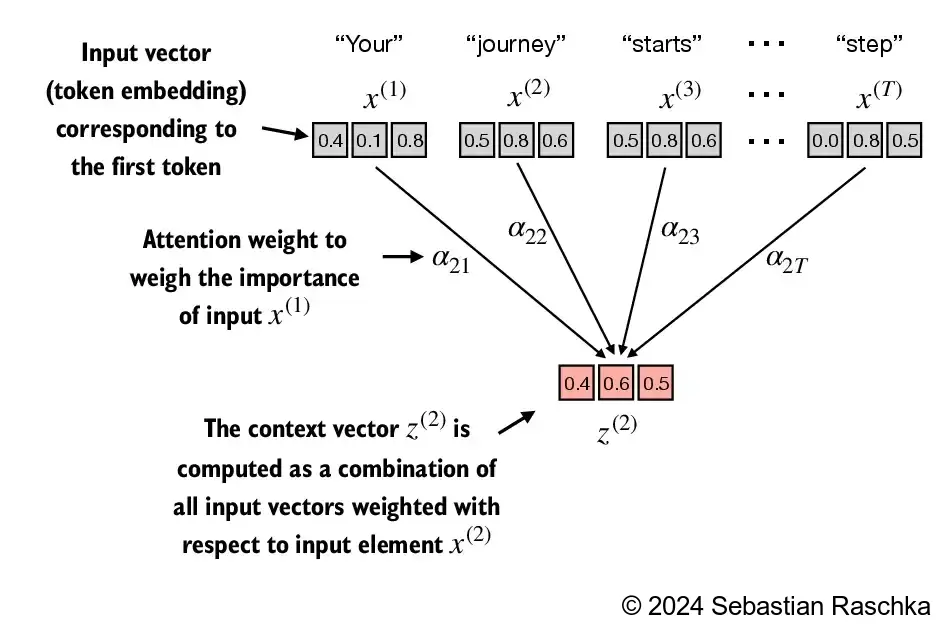

In [ ]:
import torch 

inputs = torch.tensor(
    [[0.43, 0.15, 0.89], # Your
     [0.55, 0.87, 0.66], # journey
     [0.57, 0.85, 0.64], # starts
     [0.22, 0.58, 0.33], # with
     [0.77, 0.25, 0.10], # one
     [0.05, 0.80, 0.55]] # step
)  #2d dimension tensor ,
   #where 1st dimension corresponds to the number of tokens.
   #and 2nd dimension corresponds to the dimensionaltiy of the token embeddings 

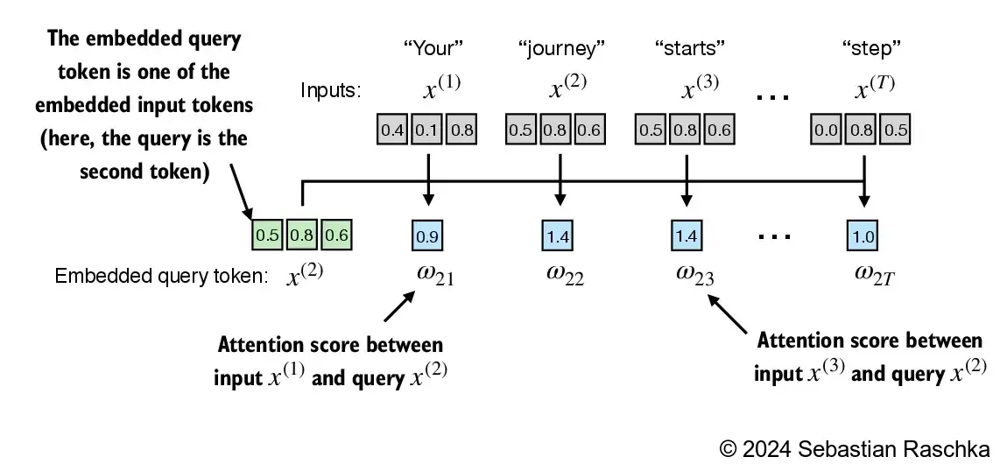

step 1 : to compute un-normalized attention scores by computing the dot product between the query x2and all other input tokens  

In [ ]:
query = inputs[1] #2nd input token in the query 
attn_scores_2 = torch.empty(inputs.shape[0]) #inputs.shape[0] -> catches the first dimension of the inputs tensor 

for i, x_i in enumerate(inputs):
    attn_scores_2[i] = torch.dot(x_i, query) # we dont need transpose here because both are 1D vectors 
    #torch.dot(x_i, query) -> sum of element wise multiplication 

print(attn_scores_2) # un-normalized attention scores 


tensor([0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865])


a dot product is essentially a shorthand for multiplying two vectors elements-wise and summing the resulting products:

In [ ]:
# working of dot product manually 

res = 0.0 #this will accumalate the sum of products between coreesponding elements in two vectors 

for idx, element in enumerate(inputs[1]):
    res += inputs[1][idx] * query[idx]

print(res)
print(torch.dot(inputs[1], query))

tensor(1.4950)
tensor(1.4950)


step2 : normalize the unnormalized attention scores "omegas" so that they sum up to 1

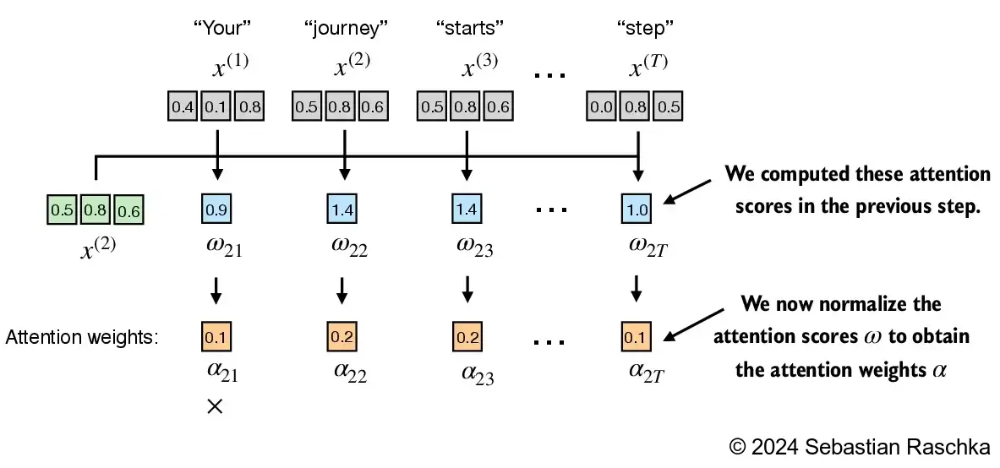

In [ ]:
attn_weights_2_tmp = attn_scores_2 / attn_scores_2.sum()

print("Attention weights: ", attn_weights_2_tmp)
print("Sum: ", attn_weights_2_tmp.sum())

Attention weights:  tensor([0.1455, 0.2278, 0.2249, 0.1285, 0.1077, 0.1656])
Sum:  tensor(1.0000)


However, in practice we use softmax function for normalization, which is better at handling extreme values and has more desirable gradient properties during training 

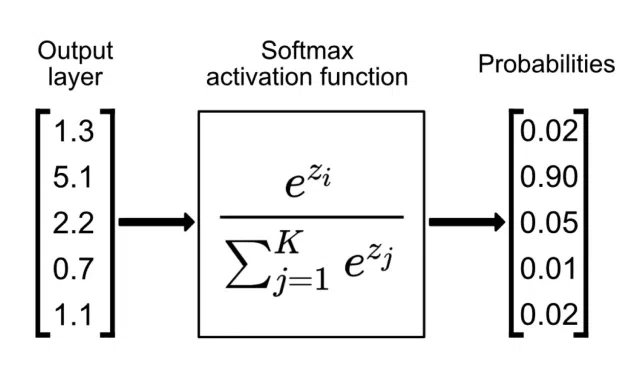

In [ ]:
def softmax_naive(x):
    return torch.exp(x) / torch.exp(x).sum(dim=0) #here dim=0 since its a 1D vector

attn_weights_2_naive = softmax_naive(attn_scores_2)

print("Attention weights: ", attn_weights_2_naive)
print("Sum: ", attn_weights_2_naive.sum())

Attention weights:  tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum:  tensor(1.)


The naive implementation above can suffer from numerical instability issues for large or small input values due to overflow and underflow issues

Hence, in practice, it's recommended to use the PyTorch implementation of softmax instead, which has been highly optimized for performance:

In [ ]:
attn_weights_2 = torch.softmax(attn_scores_2, dim=0)

print("Attention Weights: ", attn_weights_2)
print("Sum: ", attn_weights_2.sum())

Attention Weights:  tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum:  tensor(1.)


Step 3 : compute the context vector z_2 by multiplying the embedded input tokens, x_i with the attention weights  and sum the resulting vectors:

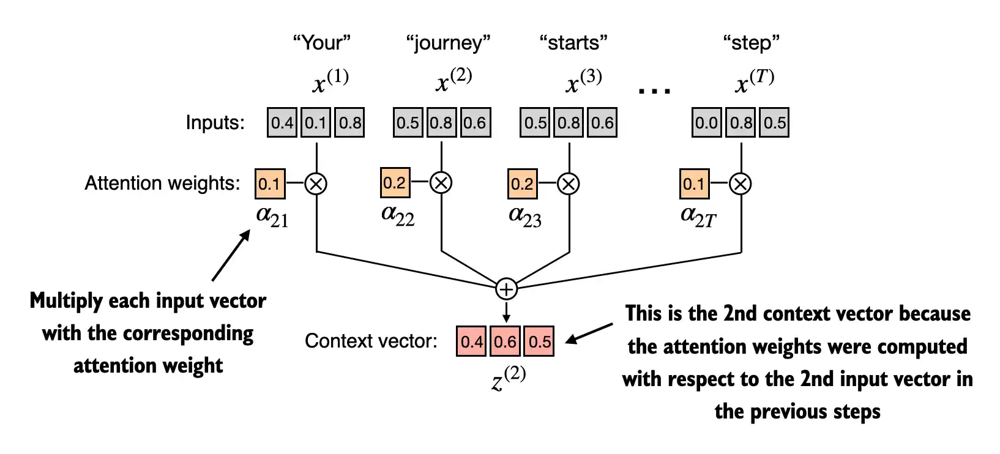

In [ ]:
query = inputs[1] # second input token is the query 
context_vec_2 = torch.zeros(query.shape)

for i, x_i in enumerate(inputs):
    context_vec_2 += attn_weights_2[i] * x_i
    
print(context_vec_2)

tensor([0.4419, 0.6515, 0.5683])


NOW COMPUTING ATTENTION WEIGHTS FOR ALL INPUT TOKENS

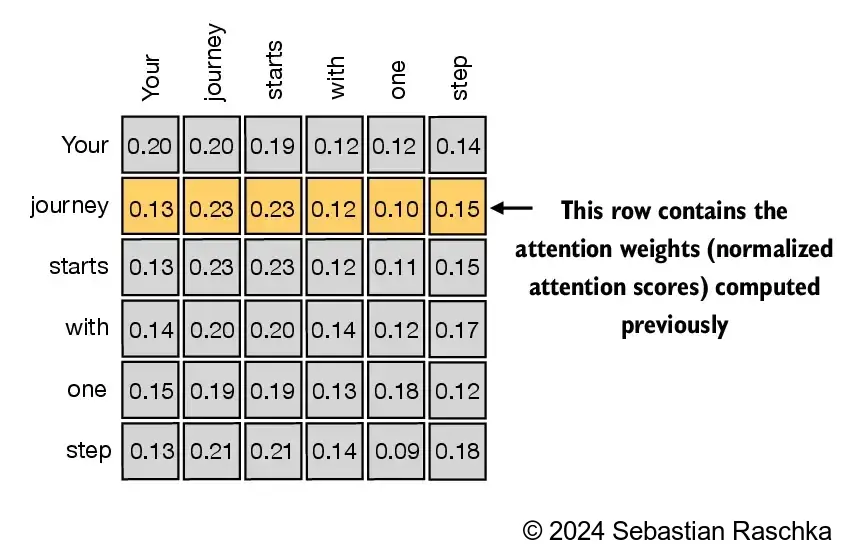

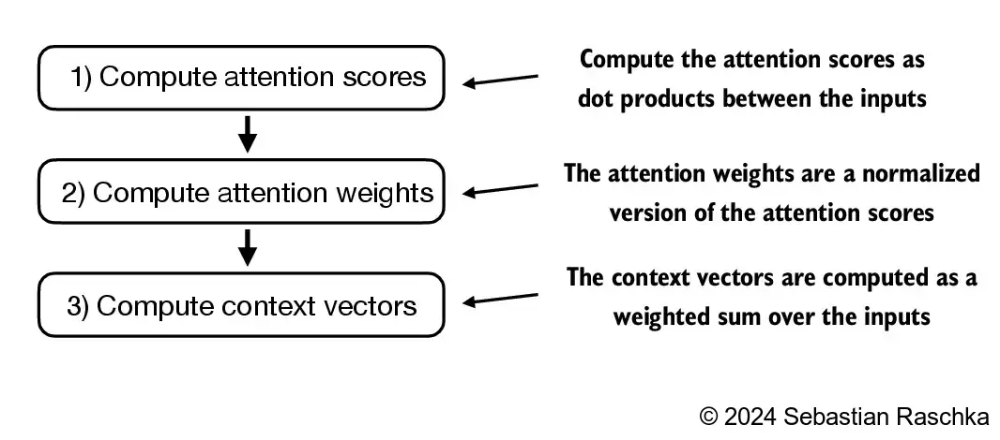

Step 1: apply previous step 1 to all pairwise elements to compute the unnormalized attention score matrix of size 6*6 as shown in figure above 

In [ ]:
attn_scores = torch.empty(6,6) #Each cell [i, j] will score attention score between: Token(i)(as the Query) AND Token(j)(as the Key)
# Two nested: loop pair wise comparison 
for i, x_i in enumerate(inputs):   #Outer Loop : Iterates through each element of the collection from the beginning.
    for j, x_j in enumerate(inputs):     #Inner Loop : For each elemented selected by the outer loop, the inner loop iterates through all the elements again .
        attn_scores[i, j] = torch.dot(x_i, x_j)

print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


we can achive same as above more efficently  via matrix multiplication 

In [ ]:
attn_scores = inputs @ inputs.T
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


Step 2 : Normalize

In [ ]:
attn_weights = torch.softmax(attn_scores, dim=1)
print(attn_weights)

tensor([[0.2098, 0.2006, 0.1981, 0.1242, 0.1220, 0.1452],
        [0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581],
        [0.1390, 0.2369, 0.2326, 0.1242, 0.1108, 0.1565],
        [0.1435, 0.2074, 0.2046, 0.1462, 0.1263, 0.1720],
        [0.1526, 0.1958, 0.1975, 0.1367, 0.1879, 0.1295],
        [0.1385, 0.2184, 0.2128, 0.1420, 0.0988, 0.1896]])


In [ ]:
# Quick verification that the values in each row indeed sum to 1

row_2_sum = sum([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
print("Row 2 sum: ", row_2_sum)
print("All row sum's: ", attn_weights.sum(dim=1))

Row 2 sum:  1.0
All row sum's:  tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])


Apply previous step 3 to compute all context vectors 

In [ ]:
all_context_vecs = attn_weights @ inputs 
print(all_context_vecs)

tensor([[0.4421, 0.5931, 0.5790],
        [0.4419, 0.6515, 0.5683],
        [0.4431, 0.6496, 0.5671],
        [0.4304, 0.6298, 0.5510],
        [0.4671, 0.5910, 0.5266],
        [0.4177, 0.6503, 0.5645]])


In [ ]:
print("Previous 2nd context vector: ", context_vec_2)

Previous 2nd context vector:  tensor([0.4419, 0.6515, 0.5683])


## Implementing Self attention with trainable weights 

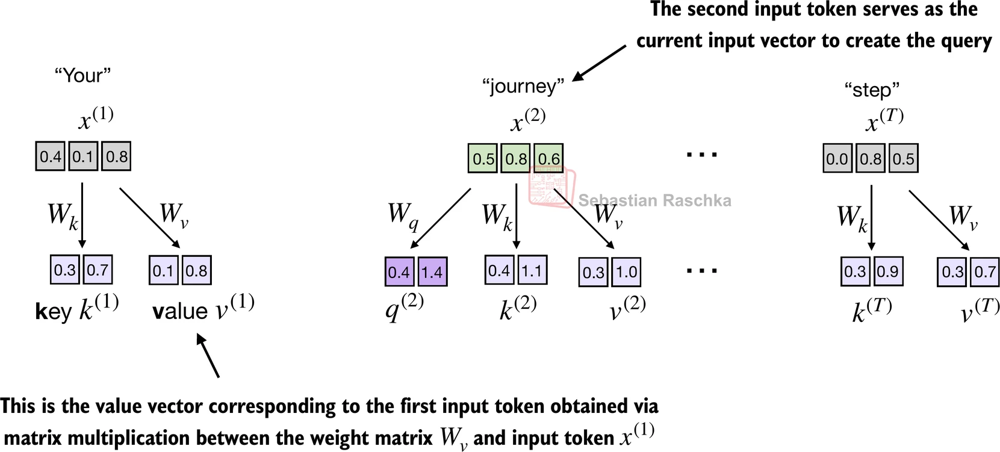

Implementing self attention mechanism step by step, we will start by introducing the three training weight matrices W_q, W_k, W_v.

Query Vector: Q(i) = x(i) W_q, 
Key Vector: K(i) = x(i) W_k, 
Value Vector: V(i) = x(i) W_v

In [ ]:
x_2 = inputs[1] # Second input token
d_in = inputs.shape[1]# Dimension of each input token vector, d=3
d_out = 2 # the output embedding size, d=2

In [ ]:
torch.manual_seed(123)

W_query = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)
W_key = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad= False)
W_value = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)

print("W_query:\n", W_query)
print("W_key:\n", W_key)
print("W_value:\n", W_value)


W_query:
 Parameter containing:
tensor([[0.2961, 0.5166],
        [0.2517, 0.6886],
        [0.0740, 0.8665]])
W_key:
 Parameter containing:
tensor([[0.1366, 0.1025],
        [0.1841, 0.7264],
        [0.3153, 0.6871]])
W_value:
 Parameter containing:
tensor([[0.0756, 0.1966],
        [0.3164, 0.4017],
        [0.1186, 0.8274]])


computing the query key and value vectors 

In [ ]:
query_2 = x_2 @ W_query # Shape: (d_out,)
key_2 = x_2 @ W_key
value_2 = x_2 @ W_value 

print("Query Vector:\n", query_2)

Query Vector:
 tensor([0.4306, 1.4551])


now implementing this same operation for all the inputs and calculate keys and values

also we projected the 6 input tokens from a 3D embedding space onto a 2D embedding space 

In [ ]:
keys = inputs @ W_key # Shape: (num_tokens, d_out)
values = inputs @ W_value 

print("Keys.shape:", keys.shape)
print(keys)
print("values.shape:", values.shape)
print(values)

Keys.shape: torch.Size([6, 2])
tensor([[0.3669, 0.7646],
        [0.4433, 1.1419],
        [0.4361, 1.1156],
        [0.2408, 0.6706],
        [0.1827, 0.3292],
        [0.3275, 0.9642]])
values.shape: torch.Size([6, 2])
tensor([[0.1855, 0.8812],
        [0.3951, 1.0037],
        [0.3879, 0.9831],
        [0.2393, 0.5493],
        [0.1492, 0.3346],
        [0.3221, 0.7863]])


step 2 : calculating the unnormalized attention scores by calculating the dot product between the query and each key vector 

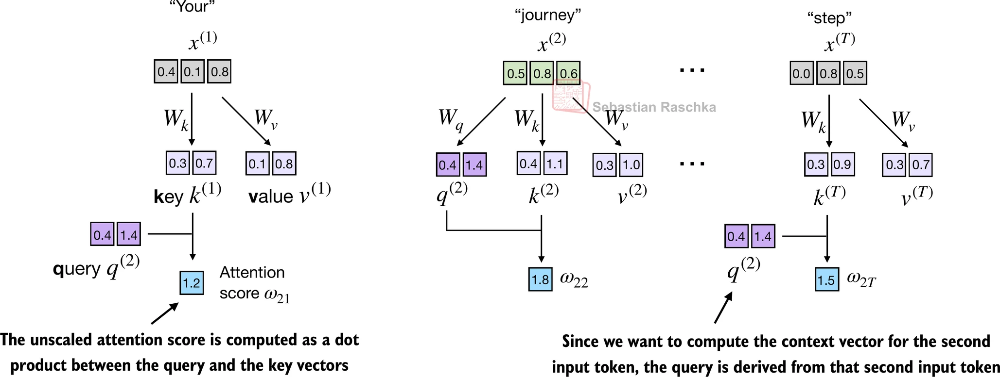

In [ ]:
# we already calculated the key, query and value vectors for the 2nd input token 
attn_score_22 = query_2.dot(key_2)
print("Attention score 22:", attn_score_22)

Attention score 22: tensor(1.8524)


since we have six inpurts we have 6 attention scores for 2nd given query vector 

In [ ]:
attn_scores_2 = query_2 @ keys.T
print("Attention scores 2:", attn_scores_2)

Attention scores 2: tensor([1.2705, 1.8524, 1.8111, 1.0795, 0.5577, 1.5440])


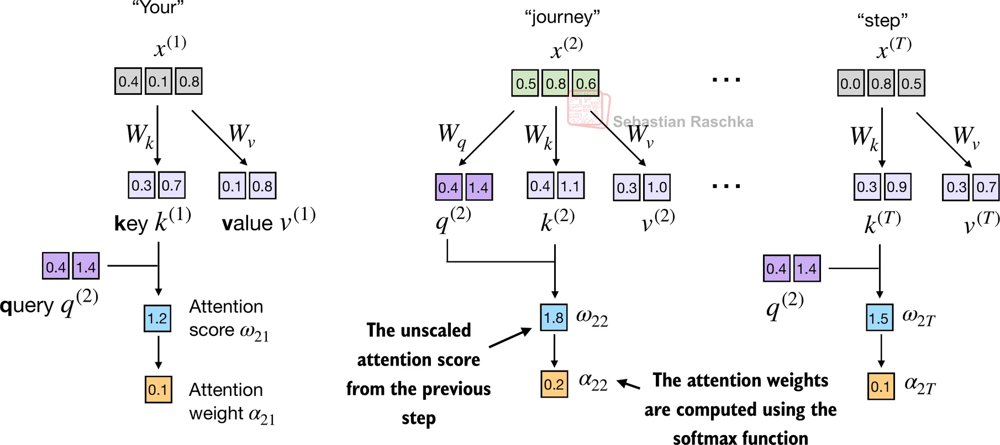

step 3: we compute attention weights (normalized attention scores)

also we scale the attention scores by dividing them by the square root of the embedding dimension (d_k**0.5)

In [ ]:
d_k = keys.shape[1]
attn_weights_2 = torch.softmax(attn_scores_2 / (d_k **0.5), dim=-1)
print("Attention weights 2:", attn_weights_2)

Attention weights 2: tensor([0.1500, 0.2264, 0.2199, 0.1311, 0.0906, 0.1820])


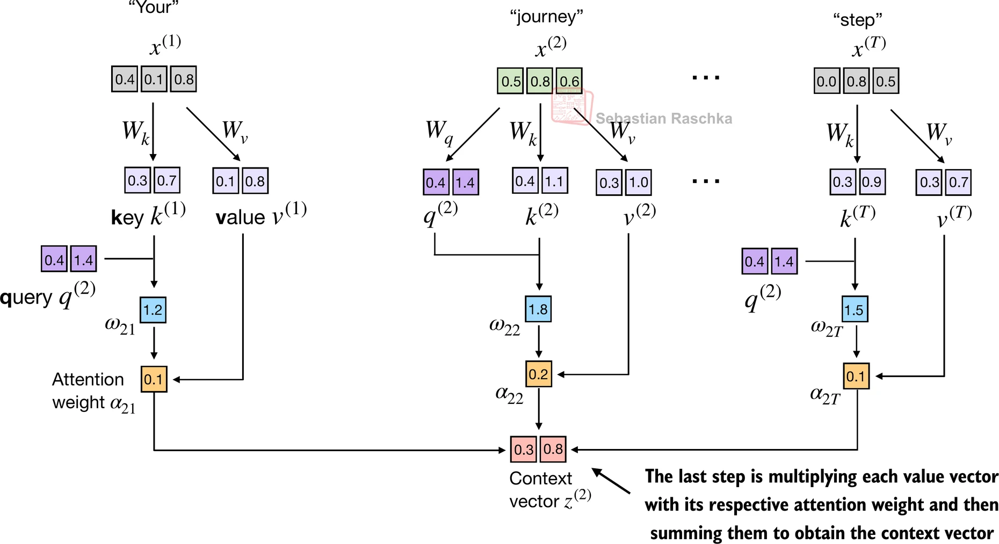

calculating the context vector for input query vector 2:

In [ ]:
context_vec_2 = attn_weights_2 @ values 
print("Context vector 2:", context_vec_2)

Context vector 2: tensor([0.3061, 0.8210])


In [ ]:
## implementing a compact self attention class ##
import torch.nn as nn
class SelfAttention_v1(nn.Module):

    def __init__(self, d_in, d_out):
        super().__init__()
        self.W_query = nn.Parameter(torch.rand(d_in, d_out), requires_grad= False)
        self.W_key = nn.Parameter(torch.rand(d_in, d_out), requires_grad= False)
        self.W_value = nn.Parameter(torch.rand(d_in, d_out), requires_grad= False)

    def forward(self, inputs):
        queries = inputs @ self.W_query   # Shape: (num_tokens, d_out)
        keys = inputs @ self.W_key 
        values = inputs @ self.W_value
        d_k = keys.shape[1]

        attn_scores = queries @ keys.T   # Shape: (num_tokens, num_tokens)
        attn_weights = torch.softmax(
            attn_scores / (d_k **0.5), dim = -1
            ) 
        
        context_vec = attn_weights @ values 
        return context_vec
# this class returns context vectors 

torch.manual_seed(123)
sa_v1 = SelfAttention_v1(d_in, d_out)
## two methods to call the forward method ##
# context_vectors = sa_v1(inputs)
# sa_v1.forward(inputs)
print("context_vectors:\n", sa_v1(inputs))

context_vectors:
 tensor([[0.2996, 0.8053],
        [0.3061, 0.8210],
        [0.3058, 0.8203],
        [0.2948, 0.7939],
        [0.2927, 0.7891],
        [0.2990, 0.8040]])


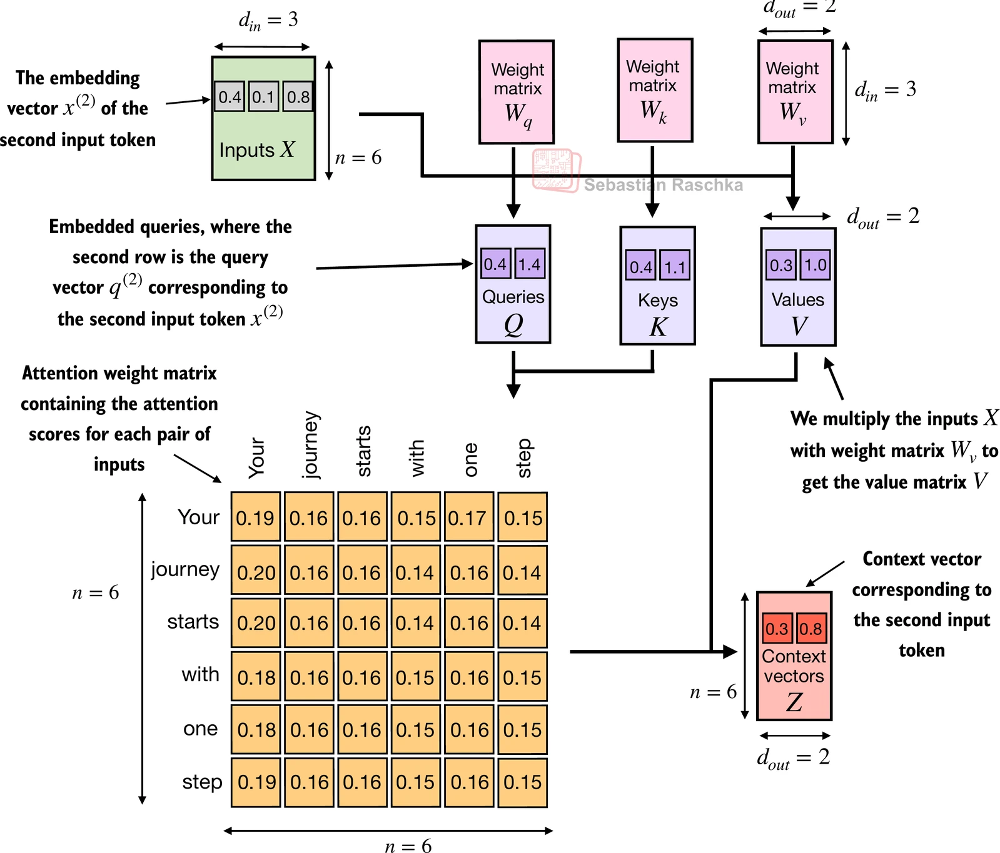

we can streamline the implemtation above using pytorch's linear layers which are equivalent to a matrix multiplication if we diasable the bias units 

In above self attention class v1: we manually defined weights using nn.Prameter , but in below v2 : we use nn.linear.

advantages of using nn.linear:
1.> automaticall handels wights and optional bias.  
2.> automatically track them as trainable parameters 
3.> compatible with optmizer and backpropagation 


In [ ]:
class SelfAttention_v2(nn.Module):

    def __init__(self, d_in, d_out, qkv_bias=False):
        super().__init__()
        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)

    def forward(self, inputs):
        keys = self.W_key(inputs)
        queries = self.W_query(inputs)
        values = self.W_value(inputs)
        d_k = keys.shape[1] # both dimension 1 and -1 are same here since its a 2D tensor

        attn_scores = queries @ keys.T
        attn_weights = torch.softmax(
            attn_scores / (d_k**0.5), dim=-1
            )
        context_vec = attn_weights @ values
        return context_vec
    
torch.manual_seed(789)
# creating the SelfAttention_v2 instance
sa_v2 = SelfAttention_v2(d_in, d_out)
print("context_vectors_v2:\n", sa_v2(inputs))

context_vectors_v2:
 tensor([[-0.0739,  0.0713],
        [-0.0748,  0.0703],
        [-0.0749,  0.0702],
        [-0.0760,  0.0685],
        [-0.0763,  0.0679],
        [-0.0754,  0.0693]], grad_fn=<MmBackward0>)


## Hiding Future words with casual attention 

Attention weights above the diagnal are masked, ensuring that for any given input, the LLM is unable to utilize the future tokens while calculating the context vectors with the attention weights

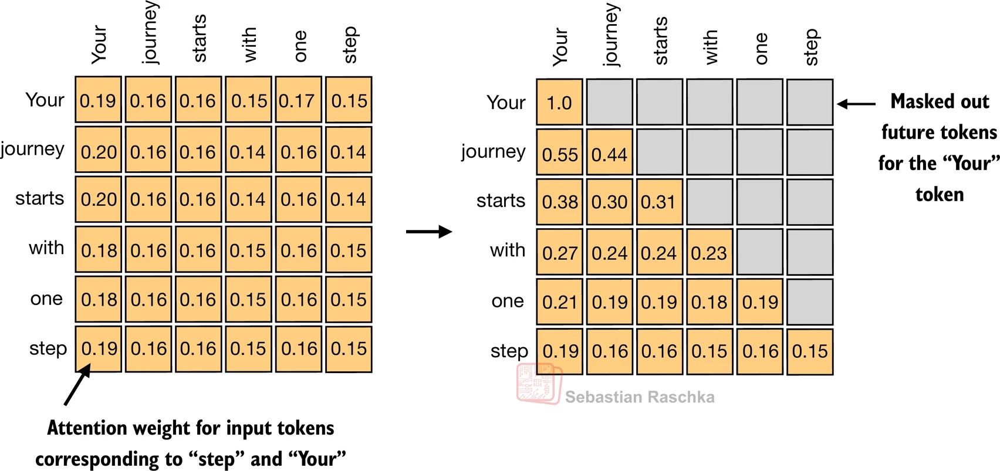

APPLYING CASUAL ATTENTION MASK

 this ensures that each next word prediction should only depend on the preceding words

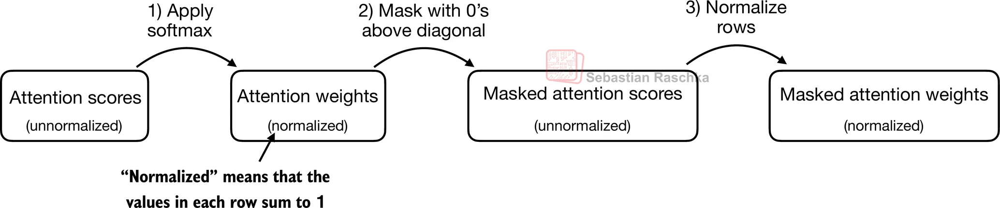

sa_v2 is an instance of the class (SelfAttention_v2) 

sa_v2 object has access to all the attribites and methods defined within the class (SelfAttention_v2)

sa_v2.W_query(inputs) -> this line calls the Method (Function defined within class that operates on instances of that class) W_query on the sa_v2 object

Abstraction : The user interacts with the SelfAttention_v2 class through its methods without needing to understand the underlying implementation detail.

Encapsualtion : The W_query and W_key methods encapsulates the funcitonality related to transforming inputs into queries and keys 

In [ ]:
# Reusing the query and key weight matrices of the 
# SelfAttention_v2 object from the previous section for convenience
# above is the explaination 

queries = sa_v2.W_query(inputs)
keys = sa_v2.W_key(inputs)
attn_scores = queries @ keys.T
d_k = keys.shape[1]
attn_weights = torch.softmax(attn_scores / (d_k ** 0.5), dim=-1)
print("Attention weights:\n", attn_weights)


Attention weights:
 tensor([[0.1921, 0.1646, 0.1652, 0.1550, 0.1721, 0.1510],
        [0.2041, 0.1659, 0.1662, 0.1496, 0.1665, 0.1477],
        [0.2036, 0.1659, 0.1662, 0.1498, 0.1664, 0.1480],
        [0.1869, 0.1667, 0.1668, 0.1571, 0.1661, 0.1564],
        [0.1830, 0.1669, 0.1670, 0.1588, 0.1658, 0.1585],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<SoftmaxBackward0>)


torch.tril -> it takes the 2D tensor as input and returns the lower triangular part of the tensor intact and setting above triangular part as zero

In [ ]:
context_lenght = attn_scores.shape[0] # number of tokens on the input sequence = 6
mask_simple = torch.tril(torch.ones(context_lenght, context_lenght))
print("Casual Attention Mask: \n", mask_simple)


Casual Attention Mask: 
 tensor([[1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1.]])


then we can multiply the attention weights with this mask to zero out the attention scores above te diagnoal 

In [ ]:
masked_simple = attn_weights * mask_simple
print("Masked Attention Weights: \n", masked_simple)

Masked Attention Weights: 
 tensor([[0.1921, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2041, 0.1659, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2036, 0.1659, 0.1662, 0.0000, 0.0000, 0.0000],
        [0.1869, 0.1667, 0.1668, 0.1571, 0.0000, 0.0000],
        [0.1830, 0.1669, 0.1670, 0.1588, 0.1658, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<MulBackward0>)


However if this mask was applied after the softmax like above it would disrupt the probability distribution created by the softmax

softmax ensures that all the output values sum to 1

To make sure that the rows sum to 1, we can normalize the attention weights as follows:

In [ ]:
row_sums = masked_simple.sum(dim=1, keepdim=True)
masked_simple_norm = masked_simple / row_sums
print("Masked and Normalizewd attention weights: \n", masked_simple_norm)

Masked and Normalizewd attention weights: 
 tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3800, 0.3097, 0.3103, 0.0000, 0.0000, 0.0000],
        [0.2758, 0.2460, 0.2462, 0.2319, 0.0000, 0.0000],
        [0.2175, 0.1983, 0.1984, 0.1888, 0.1971, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<DivBackward0>)


MORE EFFICENT APPROACH FOR IMPLEMENTING THIS 

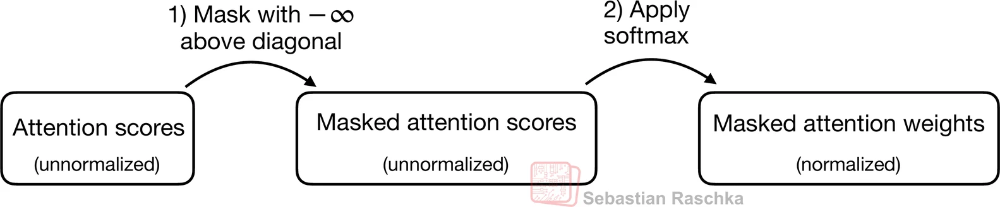

In [ ]:
mask = torch.triu(torch.ones(context_lenght, context_lenght), diagonal=1)
masked = attn_scores.masked_fill(mask.bool(), -torch.inf)
print("Masked Attnetion Scores: \n", masked)

Masked Attnetion Scores: 
 tensor([[0.2899,   -inf,   -inf,   -inf,   -inf,   -inf],
        [0.4656, 0.1723,   -inf,   -inf,   -inf,   -inf],
        [0.4594, 0.1703, 0.1731,   -inf,   -inf,   -inf],
        [0.2642, 0.1024, 0.1036, 0.0186,   -inf,   -inf],
        [0.2183, 0.0874, 0.0882, 0.0177, 0.0786,   -inf],
        [0.3408, 0.1270, 0.1290, 0.0198, 0.1290, 0.0078]],
       grad_fn=<MaskedFillBackward0>)


torch.triu(..., diagonal=1) -> this function extracts the upper traingular part of the matrix , starting from the first diagonal above the main diagonal(hence diagonal=1). 
This means all the elements on and below the main diagonal will be set to zero.


In [ ]:
 #mask

mask.bool() -> this is an funciton which converts the mask tensor into boolean tensor, where TRUE correspinds to the positions where the mask has ones (the upper triangular part)

In [ ]:
# mask.bool() 

masked_fill(mask.bool(), -torch.inf) -> this method fills in the positions of attn_scores where the mask in TRUE wiht -torch.inf (negatively infinity)


as we can see below , now the attnetion weights in each rows correctly sum to 1 again 

In [ ]:
d_k = keys.shape[1]
attn_weights = torch.softmax(masked / (d_k ** 0.5), dim=-1)
print("Masked and Normalized Attention Weights: \n", attn_weights)

Masked and Normalized Attention Weights: 
 tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3800, 0.3097, 0.3103, 0.0000, 0.0000, 0.0000],
        [0.2758, 0.2460, 0.2462, 0.2319, 0.0000, 0.0000],
        [0.2175, 0.1983, 0.1984, 0.1888, 0.1971, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<SoftmaxBackward0>)


ADDING ADITTIONAL ATTENTION WEIGHTS WITH DROPOUT 

we also apply dropout to reduce overfitting during training

Dropout can be applied in several places:
-> for example, after computing the attention weights 
-> or after multiplying the attention weights with values vectors


Here, we will apply the dropout mask after computing the attention weights because it's more common

Furthermore, in this specific example, we use a dropout rate of 50%, which means randomly masking out half of the attention weights. (When we train the GPT model later, we will use a lower dropout rate, such as 0.1 or 0.2

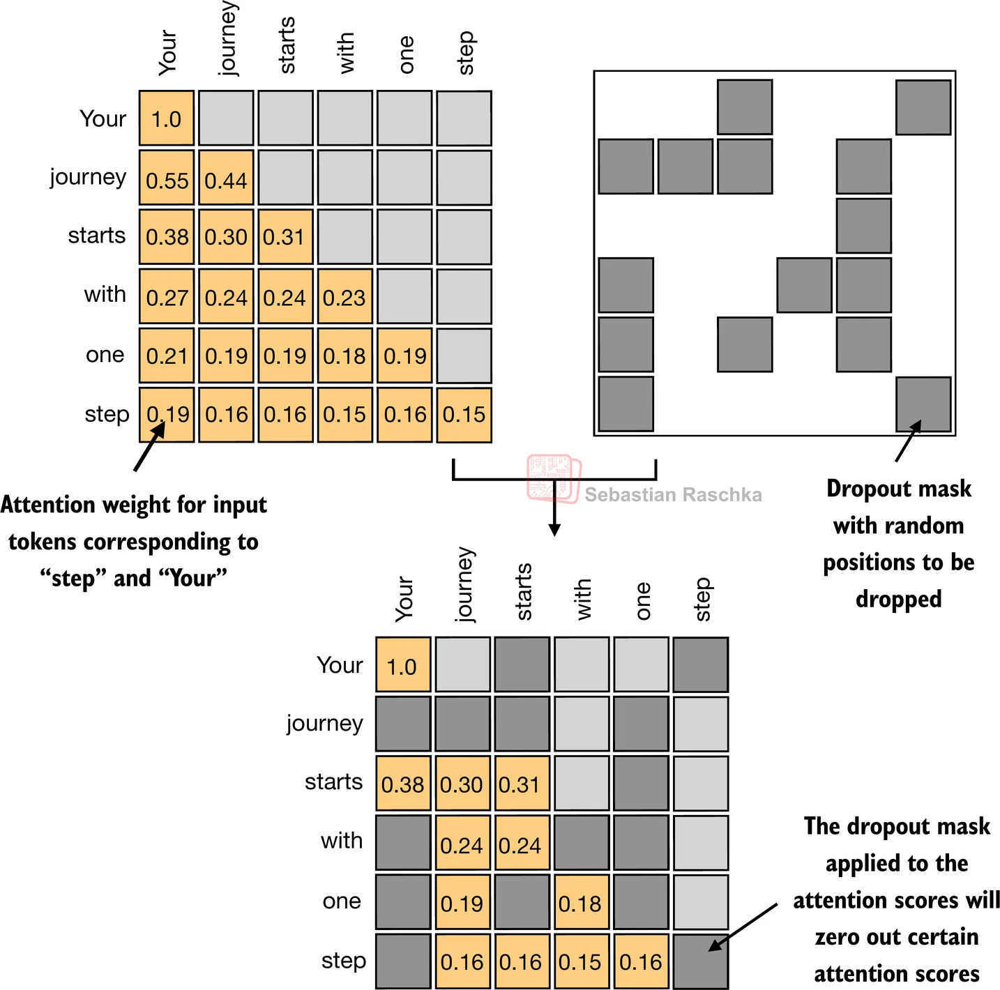

If we apply a dropout rate of 50% (0.5), hte non dropped values will be scaled accordingly by a factor of 1/0.5 = 2

this scaling is calculated by the formula -> 1/(1- dropout_rate)

In [ ]:
torch.manual_seed(123)
dropout = torch.nn.Dropout(p=0.5)
example = torch.ones(6,6)
print(example)
print(dropout(example))

tensor([[1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1.]])
tensor([[2., 2., 2., 2., 2., 2.],
        [0., 2., 0., 0., 0., 0.],
        [0., 0., 2., 0., 2., 0.],
        [2., 2., 0., 0., 0., 2.],
        [2., 0., 0., 0., 0., 2.],
        [0., 2., 0., 0., 0., 0.]])


In [ ]:
torch.manual_seed(123)
print(dropout(attn_weights))

tensor([[2.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.8966, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.6206, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4921, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4350, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.3327, 0.0000, 0.0000, 0.0000, 0.0000]],
       grad_fn=<MulBackward0>)


IMPLEMTING AN COMPACT CASUAL SELF ATTENTION CLASS 

One more thing is to implement the code to handle batches consisting of more than one input so that our CausalAttention class supports the batch outputs produced by the data loader we implemented in chapter 2

For simplicity, to simulate such batch input, we duplicate the input text example:

In [ ]:
inputs

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300],
        [0.7700, 0.2500, 0.1000],
        [0.0500, 0.8000, 0.5500]])

In [ ]:
batch = torch.stack((inputs, inputs), dim=0) # torch.stack -> concatenates a sequence of tensors along a new dimension 
print(batch.shape) # shape is now (2, 6, 3) which represnts samples in batch, tokens in sequence , embedding dimension

torch.Size([2, 6, 3])


In [ ]:
batch

tensor([[[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]],

        [[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]]])

__init__ the primary purpose of this is to set initial values for the attributes (variables) of an object when it is created.

self the first parameter of __init__ (and all instance methods). This Parameter referes to the instance of the class being created. Through self you can access and modify the attributes of that specific object.

self.___ (Attributes) -> Attributes prefixed with self. are instance variables that holds data unique to each instance of the class

these attributes are typically initialized in the __init__ method , where parameters passed to the constructor are assigned instance variable for later use 

* self.register_buffer(...) -> This creates an Buffer Tensor (non-parameter tensor).
* 'mask' -> this is the name given to the buffer. indicating it stores a mask tensor

* refer to Bonus.ipynb file in ch03 -> 03_understanding-buffers

In [ ]:
class CasualAttention(nn.Module):
    
    def __init__(self, d_in, d_out, context_length, 
                dropout, qkv_bias=False):
        super().__init__()                          # This will call (nn.Module) -> __init__() method         
        self.d_in = d_in
        self.d_out = d_out
        self.W_query = nn.Linear(d_in, d_out, bias = qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias = qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, qkv_bias)
        self.dropout = nn.Dropout(dropout) #new
        self.register_buffer('mask',
                            torch.triu(torch.ones(context_length, context_length),diagonal=1)) #new
        
    def forward(self, inputs):

        b, num_tokens, d_in = inputs.shape # b is batch size 

        # for inputs where 'num_tokens' exceeds the 'context_lenght', this will raise an error
        # in the mask creation further below 
        # In practice this is not an problem since we can ensure that the input sequence length is always less than or equal to the context_length during training and inference

        keys = self.W_key(inputs)
        queries = self.W_query(inputs)
        values = self.W_value(inputs)
        d_k = keys.shape[-1] # scaling factor
        # here since inputs is 3D tensor we use -1 to catch the last dimension 

        attn_scores = queries @ keys.transpose(1,2)
        # also since inputs is 3D tensor we need to transpose the 2nd and 3rd dimension of keys tensor
        # actuall shape of queries and keys is (b, num_tokens, d_out)
        # so to perform batch matrix multiplication we need keys to be shape of (b, d_out, num_tokens)

        attn_scores.masked_fill_(
            self.mask.bool()[:num_tokens, :num_tokens], -torch.inf 
        ) # :num_tokens to handle variable inputs lengths

        attn_weights = torch.softmax(
            attn_scores / (d_k ** 0.5), dim = -1
        )

        attn_weights = self.dropout(attn_weights) #new

        context_vec = attn_weights @ values 
        return context_vec


In [ ]:
torch.manual_seed(123)

context_lenght = batch.shape[1] # number of tokens in the input sequence
d_in = batch.shape[2] # dimension of each input token vector
ca = CasualAttention(d_in, d_out, context_lenght, dropout=0.0)

context_vectors = ca(batch)
print("Context Vectors: \n", context_vectors)

Context Vectors: 
 tensor([[[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5299, -0.1081]],

        [[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5299, -0.1081]]], grad_fn=<UnsafeViewBackward0>)


Note that dropout is only applied during training, not during inference

## Multi Head Attention 

STACKING MULTIPLE SINGLE HEAD ATTENTION LAYERS 

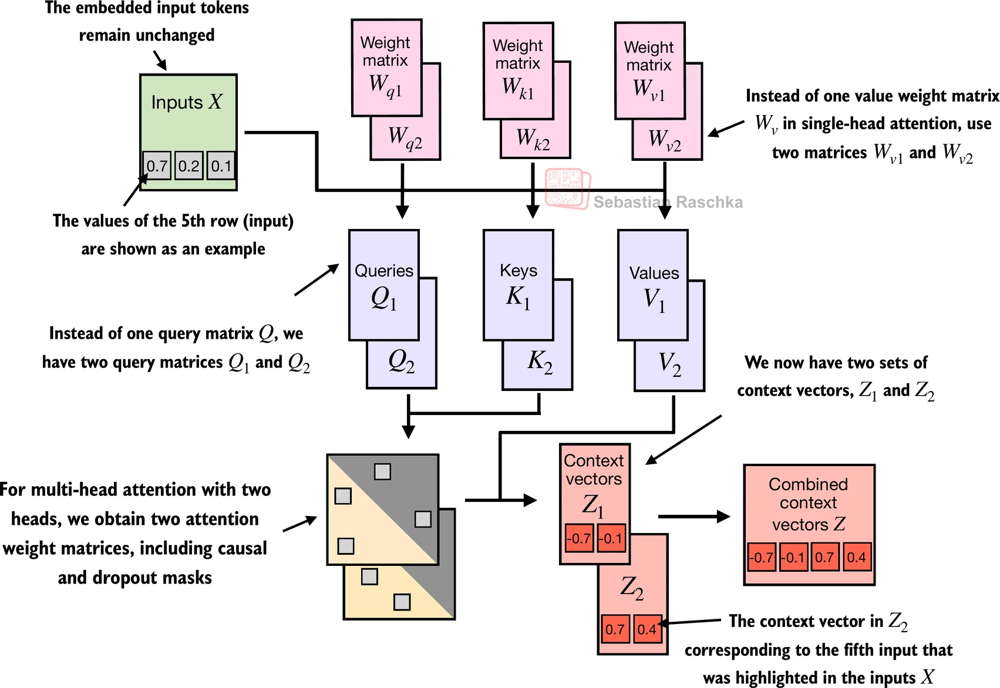

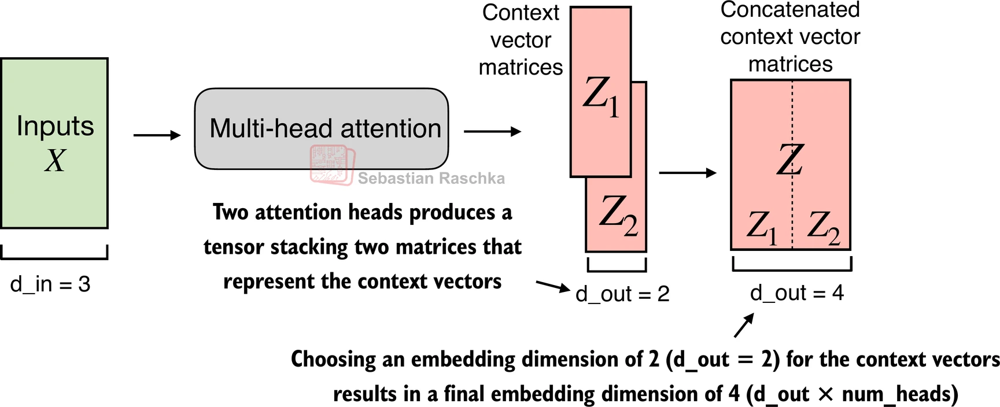

The main idea behind multi-head attention is to run the attention mechanism multiple times (in parallel) with different, learned linear projections. This allows the model to jointly attend to information from different representation subspaces at different positions.

In [ ]:
# This class creates multiple independent copies of CasualAttention and concateanates their output along the last dimension 

class MultiHeadAttentionWrapper(nn.Module):
    
    def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__() #this initialize the paretn class (nn.Module)

        # Below is a ModuleList that holds 'num_heads',
        # it ensures that theyre registered properly in the model so there parameters are tracked.
        self.heads = nn.ModuleList(
            [CasualAttention(d_in, d_out, context_length, dropout, qkv_bias)
             for _ in range(num_heads)])
        #This creates multilple independent copies of CasualAttention class
        #"_" is a throwaway variable since we dont need to use the loop variable

    def forward(self, inputs):

        # For each head in the ModuleList, we pass the inputs through it
        # and collects their outputs in the list comprehension
        return torch.cat(
            [head(inputs) for head in self.heads], dim=-1)
        # torch.cat -> concatenate along the last dimension
        # so the final output will have shape (b, num_tokens, d_out * num_heads)

In [ ]:
torch.manual_seed(123)

context_length = batch.shape[1] 
d_in, d_out = 3,2
# Creating the MultiHeadAttentionWrapper instance
mha = MultiHeadAttentionWrapper(d_in, d_out, context_length,
                                dropout=0.0, num_heads=2)

In [ ]:
context_vects = mha(batch)
print("Multi-Head Context Vectors: \n", context_vects)

Multi-Head Context Vectors: 
 tensor([[[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5299, -0.1081,  0.5077,  0.3493]],

        [[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5299, -0.1081,  0.5077,  0.3493]]], grad_fn=<CatBackward0>)


In the above implementation, the embedding dimension is 4 for Final context vectors output. because d_out = 2 asthe embedding dimension for query,key,value vectors as well as the context vector. and since we have 2 attention heads, we have the output embedding dimension as 2*2 = 4

IMPLEMENTING MULTI HEAD ATTENTION WITH WEIGHT SPLITS 

Implementing an stand alone MultiHeadAttention class 

we dont concatenate single attention for this MultiHeadAttention class, Instead we create single W_query, W_key, W_value weight matrices for each attention head 

In [ ]:
class MultiHeadAttention(nn.Module):

    def __init__(self, d_in, d_out, context_length,
                dropout, num_heads, qkv_bias=False):
        super().__init__()

        assert (d_out % num_heads ==0), "d_out must be divisible by num_heads"
        # this ensures that each attention head gets an equal share of the output dimension

        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads # each head gets equal share
        
        self.W_query = nn.Linear(d_in, d_out, bias = qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias = qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias =qkv_bias)
        self.out_proj = nn.Linear(d_out, d_out) # final linear projection applied after concatenation of all head outputs
        self.dropout = nn.Dropout(dropout)
        self.register_buffer('mask',
                             torch.triu(torch.ones(context_length, context_length), diagonal=1))
        
    def forward(self, inputs):
        b, num_tokens, d_in = inputs.shape 
        
        queries = self.W_query(inputs) # Shape: (b, num_tokens, d_out)
        keys = self.W_key(inputs)
        values = self.W_value(inputs)

        # Reshaping the queries, keys and values vectors to separate the heads
        # basically tokens embeddings are split into multiple heads equally (d_out -> num_heads * head_dim) or (embedding_dim -> num_heads * (embedding_dim / num_heads))
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)

        # Transpose to get dimensions in shape (b, num_heads, num_tokens, head_dim)
        queries = queries.transpose(1,2)
        keys = keys.transpose(1,2)
        values = values.transpose(1,2)
        #now for each batch and each head we have a seprate matrix of (num_tokens, head_dim)

        d_k = keys.shape[-1]

        #computing scaled dot product attention (aka self-attention) with a casual mask
        #for each head
        attn_scores = queries @ keys.transpose(2,3) # shape: (b, num_heads, num_tokens, num_tokens)
        
        # Original mask truncated to the number of tokens and converted to boolean
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens]

        #use the mask to fill attention scores
        attn_scores.masked_fill_(mask_bool, -torch.inf)

        attn_weights = torch.softmax(attn_scores / (d_k ** 0.5), dim=-1)
        attn_weights = self.dropout(attn_weights)

        context_vec = attn_weights @ values
        # shape: (b, num_heads, num_tokens, head_dim):
        # using .transpose(1,2) to convert shape into (b, num_tokens, num_heads, head_dim)
        # beacuse in next step we'll combine all heads into single vector per token
        context_vec = context_vec.transpose(1,2)
        context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)
        # here .contiguous() is used to ensure that the tensor is stored in a contigous block of memory
        # .view() is then used to reshape the tensor into (b, num_tokens, d_out),
        # it flattens the last two dimension(num_heads * head_dim = d_out)
        context_vec = self.out_proj(context_vec)

        return context_vec 

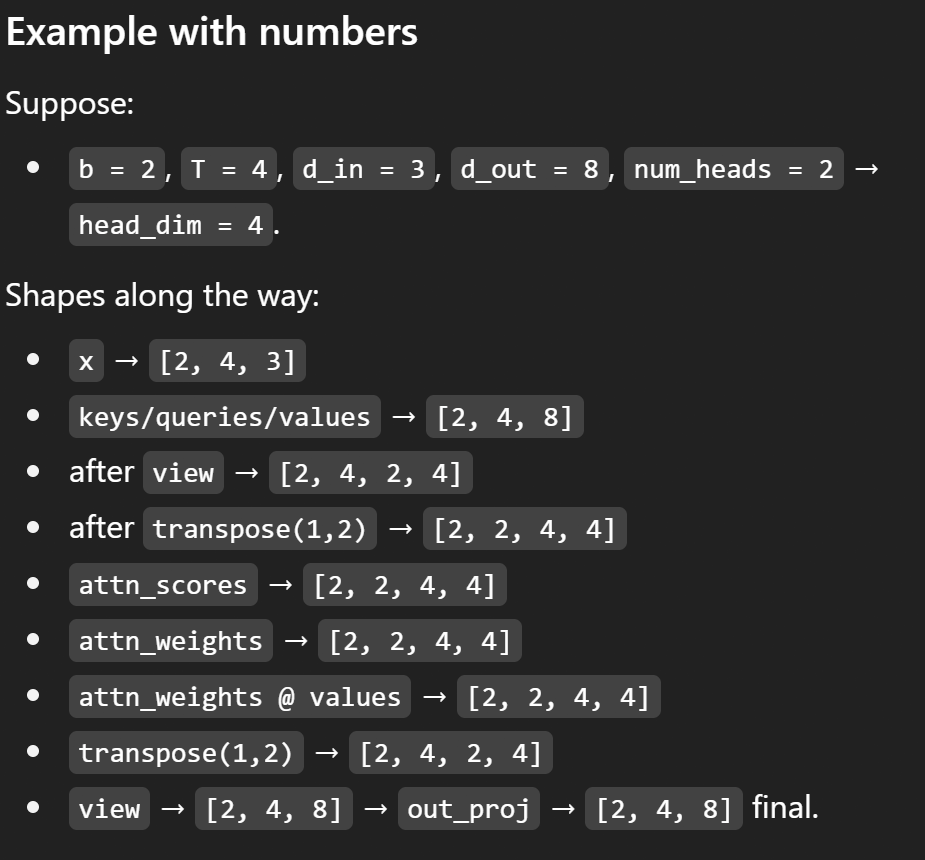

In [ ]:
batch

tensor([[[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]],

        [[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]]])

In [ ]:
torch.manual_seed(123)

batch_size, context_length, d_in = batch.shape
d_out = 2
mha = MultiHeadAttention(d_in, d_out, context_length, dropout=0.0, num_heads=2)

context_vecs = mha(batch)

print(context_vecs)
print("Context_vecs.shape", context_vecs.shape)

tensor([[[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2575, 0.4028]],

        [[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2575, 0.4028]]], grad_fn=<ViewBackward0>)
Context_vecs.shape torch.Size([2, 6, 2])


note above is an essentially a rewritten version of MultiHeadAttentionWrapper that is more efficent 

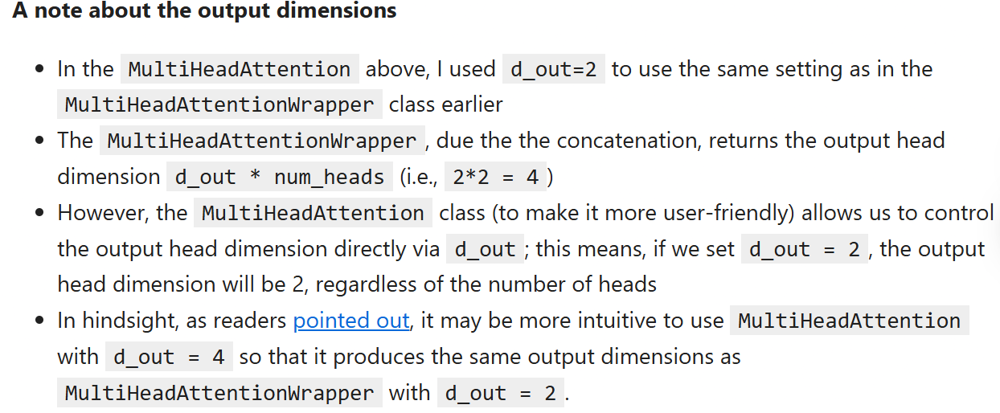

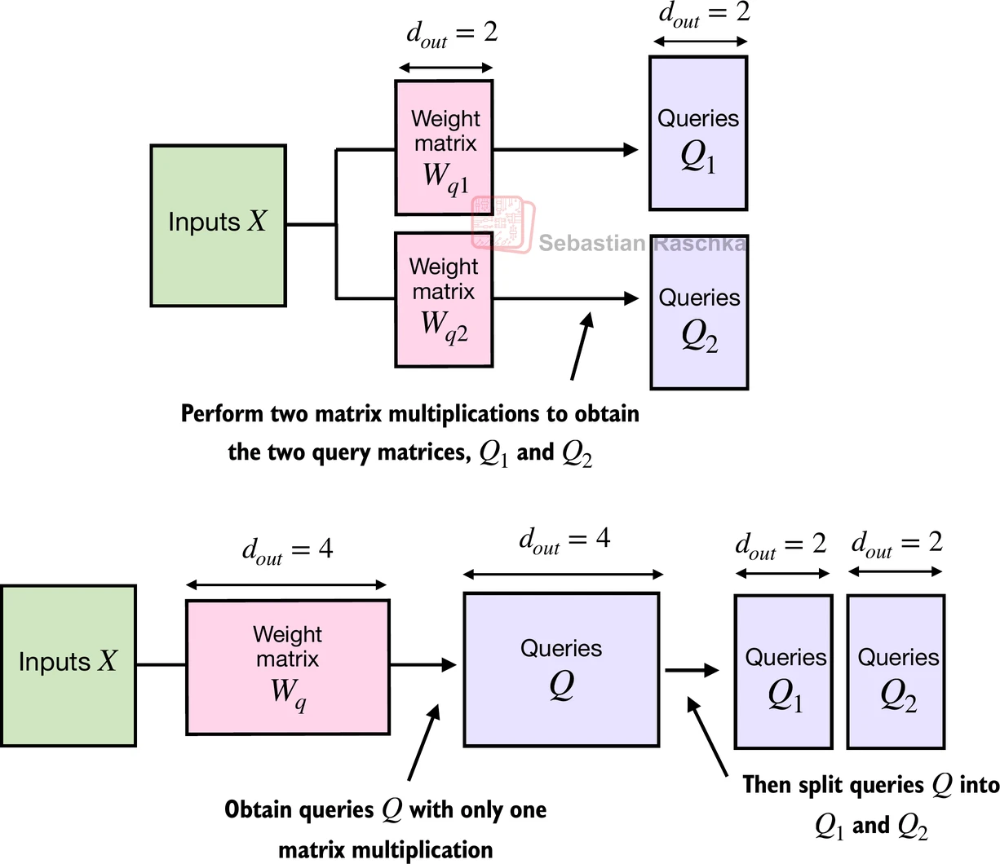

In [ ]:
## example calculation ##
## attn_scores = queries @ keys.transpose(2, 3) ##

a = torch.tensor([[[[0.2745, 0.6584, 0.2775, 0.8573],
                    [0.8993, 0.0390, 0.9268, 0.7388],
                    [0.7179, 0.7058, 0.9156, 0.4340]],

                   [[0.0772, 0.3565, 0.1479, 0.5331],
                    [0.4066, 0.2318, 0.4545, 0.9737],
                    [0.4606, 0.5159, 0.4220, 0.5786]]]])
print(a.shape)
attn_score_example = a @ a.transpose(2,3)
print(attn_score_example)
print( attn_score_example.shape)

# in this example we are matrix multiplication implementation in pytorch
# which will handle the the 4 dimensional input tensor
# so that the matrix multiplication is carried out between the 2 last dimensions
# (num_tokens, head_dim) and then repreated for individaul heads

torch.Size([1, 2, 3, 4])
tensor([[[[1.3208, 1.1631, 1.2879],
          [1.1631, 2.2150, 1.8424],
          [1.2879, 1.8424, 2.0402]],

         [[0.4391, 0.7003, 0.5903],
          [0.7003, 1.3737, 1.0620],
          [0.5903, 1.0620, 0.9912]]]])
torch.Size([1, 2, 3, 3])


In [ ]:
## for instance the following is the more compact way to compute the matrix multiplication for each head seprately 

first_head = a[0,0,:,:]
first_res = first_head @ first_head.T
print("First Head:\n", first_res)

second_head = a[0,1,:,:]
second_res = second_head @ second_head.T
print("\n Second Head \n", second_res)

First Head:
 tensor([[1.3208, 1.1631, 1.2879],
        [1.1631, 2.2150, 1.8424],
        [1.2879, 1.8424, 2.0402]])

 Second Head 
 tensor([[0.4391, 0.7003, 0.5903],
        [0.7003, 1.3737, 1.0620],
        [0.5903, 1.0620, 0.9912]])


## CH-04

## IMPLEMENTING A GPT MODEL FROM SCRATCH TO GENERATE TEXT 

In [ ]:
from importlib.metadata import version

print("matplotlib version: ", version("matplotlib"))
print("torch version", version("torch"))
print("tiktoken version: ", version("tiktoken"))

matplotlib version:  3.10.5
torch version 2.5.1
tiktoken version:  0.11.0


CODING AN LLM ARCHITECTURE

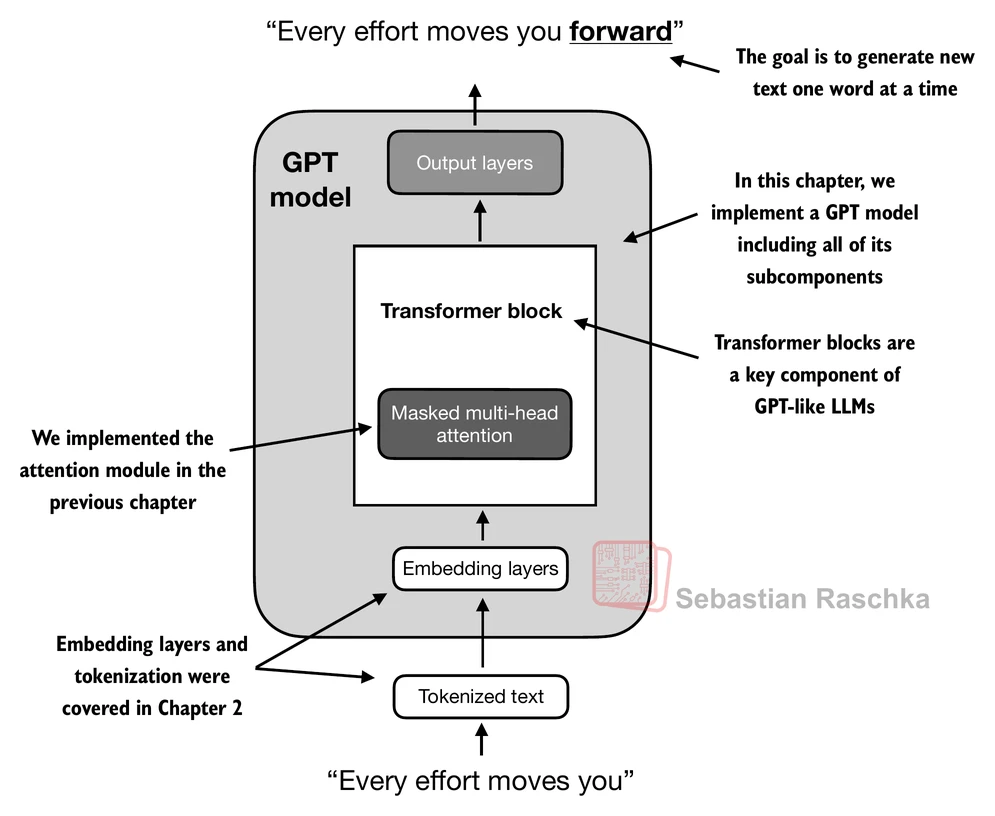

configuration detail for the 124 million parameter GPT-2 model include:

In [ ]:
GPT_CONFIG_124M = {
    "vocab_size": 50257,
    "context_length": 1024,
    "emb_dim" :768,
    "n_heads": 12,
    "n_layers": 12,
    "drop_rate": 0.1,
    "qkv_bias": False
}

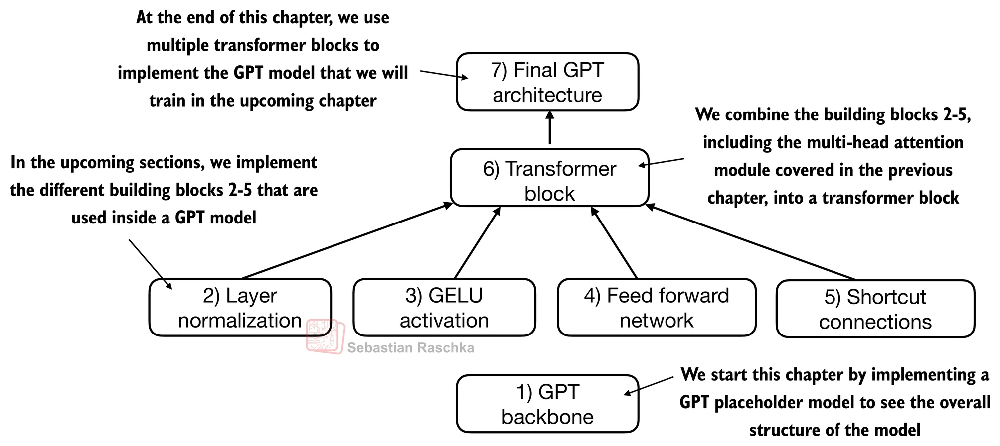

this is basically an blueprint of GPT, but with the heavy computation parts removed

In [ ]:
import torch
import torch.nn as nn

class DummyGPTModel(nn.Module): 
    def __init__(self, cfg):   # cfg -> configuration dictationary
        super().__init__()
        self.tok_emb = nn.Embedding(cfg["vocab_size"], cfg["emb_dim"])  
        self.pos_emb = nn.Embedding(cfg["context_length"], cfg["emb_dim"])
        self.drop_emb = nn.Dropout(cfg["drop_rate"])

        # use a placeholder for transformer blocks (Stack)
        # creates a stack of identical layers
        self.trf_blocks = nn.Sequential(
            *[DummyTransformerBlock(cfg) for _ in range(cfg["n_layers"])]
        )
        # List Comprehension: creates a list of DummyTransformerBlock objects
        # Also this creates an instance of transformer block, passing the configuration cfg to its constructor 
        # ( * ) -> this operator unpacks the list into individual arguments 
        # this is neccesary because nn.Sequential expects its layers/modules as separate arguments rather than a single list 

        # use a placeholder for LayerNorm
        self.final_norm = DummyLayerNorm(cfg["emb_dim"])
        self.out_head = nn.Linear(cfg["emb_dim"], cfg["vocab_size"], bias=False)

    def forward(self, in_idx):
        # (in_idx) a tensor of token indices -> shape (batch_size, seq_len)
        batch_size, seq_len = in_idx.shape
        
        tok_embeds = self.tok_emb(in_idx)
        # convert each token index into embedding vector
        # shape : (batch_size, seq_len, emb_dim)

        pos_embeds = self.pos_emb(torch.arange(seq_len, device=in_idx.device))
        # looks up the positional embedding for each position 
        # shape : (seq_len, emb_dim)

        x = tok_embeds + pos_embeds
        # adds them element wise
        # each token now contain semantic meaning and positional meaning
        # Shape : (batch_size, seq_len, emb_dim)

        x = self.drop_emb(x)
        x = self.trf_blocks(x)
        # pass through trandformer blocks
        x = self.final_norm(x)
        logits = self.out_head(x)
        return logits
    
class DummyTransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        #A simple Place holder

    def forward(self, x):
        # this block does nothing and returns its input 
        return x
    
class DummyLayerNorm(nn.Module):
    def __init__(self, normalized_shape, els=1e-5):
        super().__init__()
        # the parameter here are just to mimic the LayerNorm interface .

    def forward(self, x):
        # this layer does nothing and just returns the input 
        return x
    

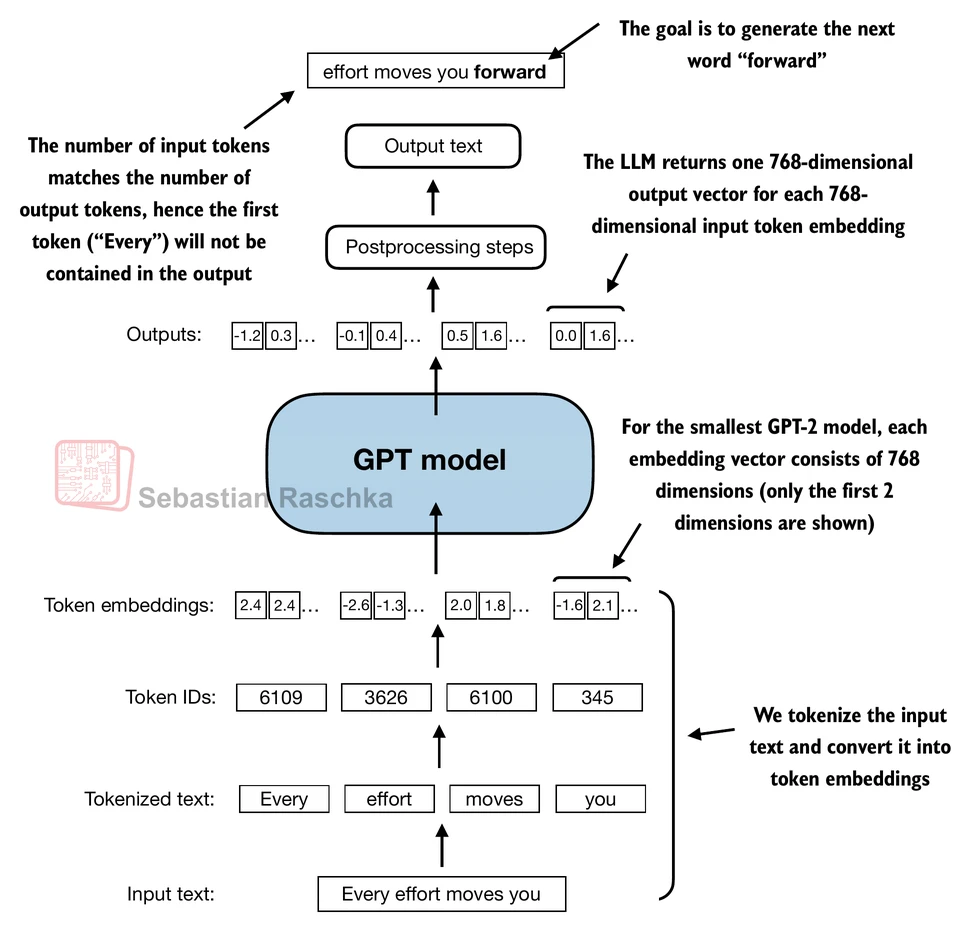

In [ ]:
import tiktoken 

tokenizer = tiktoken.get_encoding("gpt2")

batch = []
txt1 = "Every effort moves you"
txt2 = "Every day holds a"

encoded_txt1 = tokenizer.encode(txt1)
encoded_txt2 = tokenizer.encode(txt2)

encoded_txt1 = torch.tensor(encoded_txt1)
encoded_txt2 = torch.tensor(encoded_txt2)

batch.append(encoded_txt1)
batch.append(encoded_txt2)

batch = torch.stack(batch, dim=0)
# takes the list of tensor in batch and stacks them into a single tensor along new dimension=0
# resulting into an 2D tensor 
print(batch)

tensor([[6109, 3626, 6100,  345],
        [6109, 1110, 6622,  257]])


In [ ]:
torch.manual_seed(123)
model = DummyGPTModel(GPT_CONFIG_124M)

logits = model(batch)
print("Output Shape: ", logits.shape)
print(logits)

Output Shape:  torch.Size([2, 4, 50257])
tensor([[[-0.9289,  0.2748, -0.7557,  ..., -1.6070,  0.2702, -0.5888],
         [-0.4476,  0.1726,  0.5354,  ..., -0.3932,  1.5285,  0.8557],
         [ 0.5680,  1.6053, -0.2155,  ...,  1.1624,  0.1380,  0.7425],
         [ 0.0447,  2.4787, -0.8843,  ...,  1.3219, -0.0864, -0.5856]],

        [[-1.5474, -0.0542, -1.0571,  ..., -1.8061, -0.4494, -0.6747],
         [-0.8422,  0.8243, -0.1098,  ..., -0.1434,  0.2079,  1.2046],
         [ 0.1355,  1.1858, -0.1453,  ...,  0.0869, -0.1590,  0.1552],
         [ 0.1666, -0.8138,  0.2307,  ...,  2.5035, -0.3055, -0.3083]]],
       grad_fn=<UnsafeViewBackward0>)


NORMALIZING ACTIVATIONS WITH LAYER NORMALIZATION 

Layer Normalization centres the activations of neural networklayer around a mean of 0 and noramlizes there variance to 1 

this stabalizes training and enables faster convergence to effectiuve weights

Layer normalization is applied both before and after the multi-head attention module within the transformer block.

it's also applied before the final output layer

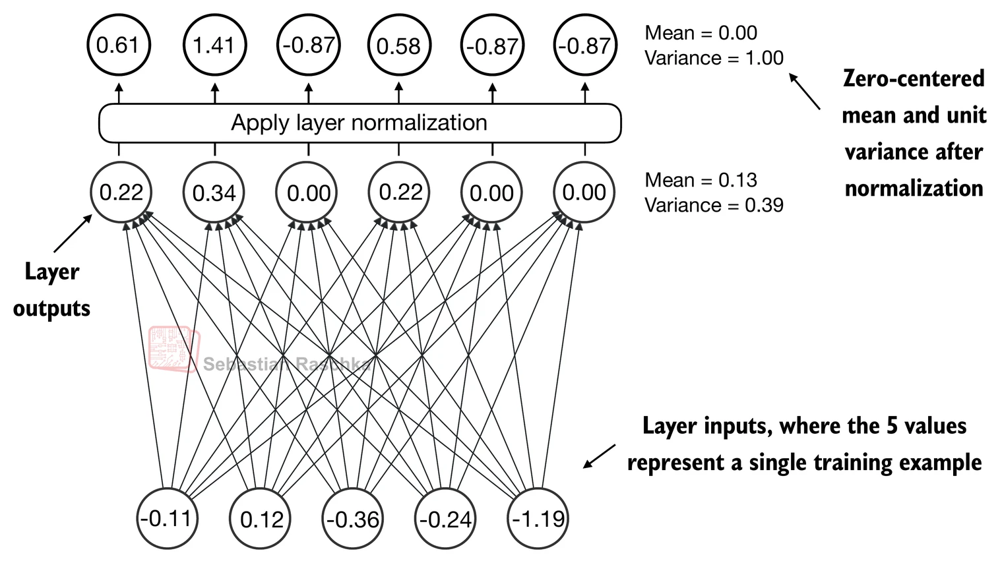

Implementing an neural network layer with 5 inputs and 6 outputs

In [ ]:
## working of layer normalization by passing a small input sample through a simple neural netowork layer:

torch.manual_seed(123)

#create 2 training example with 5 dimensions (features) each
batch_example = torch.randn(2,5)

layer = nn.Sequential(nn.Linear(5,6),
                      nn.ReLU())
out = layer(batch_example)
print(out)

tensor([[0.2260, 0.3470, 0.0000, 0.2216, 0.0000, 0.0000],
        [0.2133, 0.2394, 0.0000, 0.5198, 0.3297, 0.0000]],
       grad_fn=<ReluBackward0>)


In [ ]:
## computing mean and variance for each of the 2 inputs 

mean = out.mean(dim =-1, keepdim=True) #OR dim=1
var = out.var(dim =-1, keepdim=True)

print("Mean: \n", mean)
print("Variance: \n", var)

Mean: 
 tensor([[0.1324],
        [0.2170]], grad_fn=<MeanBackward1>)
Variance: 
 tensor([[0.0231],
        [0.0398]], grad_fn=<VarBackward0>)


the normalization is applied to each of the inputs(rows) independently using dim = -1 applies the calcualtion across
the alst dimension (in this case the feature dimension) instad of row dimension 

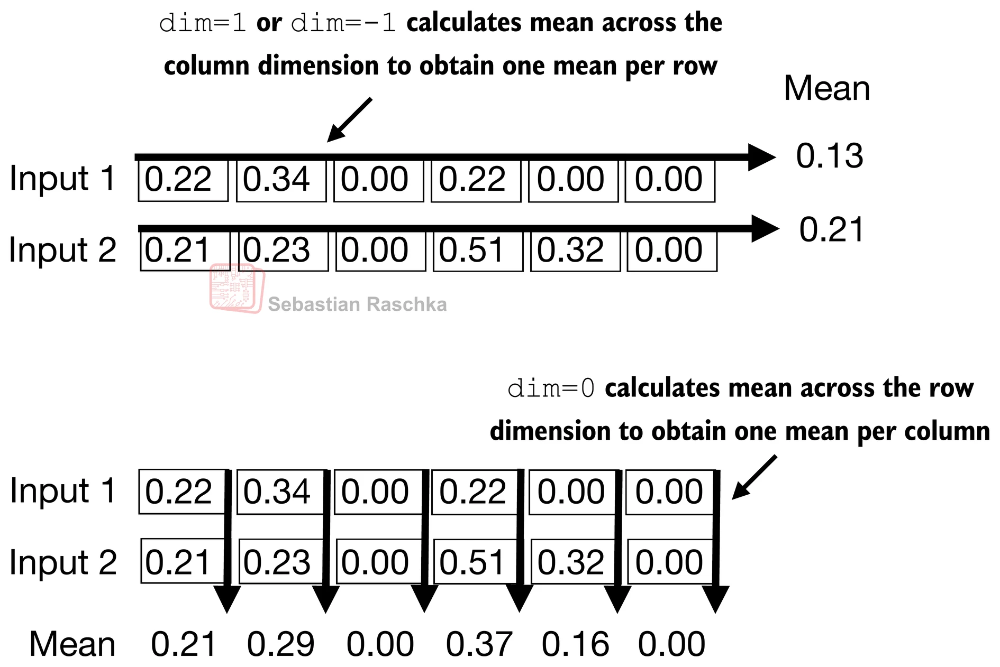

Subtracting the mean and dividing by the square root of the variance (strandard deviation) centres the inputs to have the mean of 0 and variance of 1 across the the column dimension:

In [ ]:
out_norm = (out - mean) / torch.sqrt(var)
print("Normalized layer outputs: \n", out_norm)
print("out_norm.shape ", out_norm.shape)

Normalized layer outputs: 
 tensor([[ 0.6159,  1.4126, -0.8719,  0.5872, -0.8719, -0.8719],
        [-0.0189,  0.1121, -1.0876,  1.5173,  0.5647, -1.0876]],
       grad_fn=<DivBackward0>)
out_norm.shape  torch.Size([2, 6])


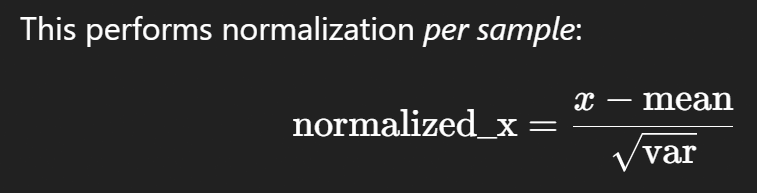

In [ ]:
#verifying normalization effect
mean = out_norm.mean(dim=-1, keepdim=True)
var = out_norm.var(dim=-1, keepdim=True)
print("Mean: \n", mean)
print("Variance: \n", var)

Mean: 
 tensor([[9.9341e-09],
        [0.0000e+00]], grad_fn=<MeanBackward1>)
Variance: 
 tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


each input is centered at 0 and has a unit varinace of 1;
to improve readability, we can disable PyTorch's scientific notation:

In [ ]:
torch.set_printoptions(sci_mode=False)
print("Mean: \n", mean)
print("Variance: \n", var)

Mean: 
 tensor([[    0.0000],
        [    0.0000]], grad_fn=<MeanBackward1>)
Variance: 
 tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


In [ ]:
## NOW USING SAME IDEA WE CAN IMPLEMENT SAME NORMALIZATION CLASS ##

class LayerNorm(nn.Module):
    def __init__(self, emb_dim):
        super().__init__()         # calling the constructor of nn.Module of the parent class to initialize the module properly
        self.eps = 1e-5            # this set an small constant value eps which is used to prevent divison by zero during normalization 
        self.scale = nn.Parameter(torch.ones(emb_dim))  #Learnable parameter that let model to adjust variance of the normalized output 
        self.shift = nn.Parameter(torch.zeros(emb_dim))  #Learnabel parameter that let model to adjust the mean of the normalized output 

    def forward(self, x):
        mean = x.mean(dim=-1, keepdim=True)
        var = x.var(dim=-1, keepdim=True, unbiased=False)
        norm_x = (x - mean) / torch.sqrt(var + self.eps)
        return self.scale * norm_x + self.shift

Biased Variance :

In the variance calculation above, setting unbiased=False means using the formula 
 
 to compute the variance where n is the sample size (here, the number of features or columns); this formula does not include Bessel's correction (which uses n-1 in the denominator), thus providing a biased estimate of the variance

For LLMs, where the embedding dimension n is very large, the difference between using n and n-1 is negligible

However, GPT-2 was trained with a biased variance in the normalization layers, which is why we also adopted this setting for compatibility reasons with the pretrained weight

In [ ]:
batch_example

tensor([[-0.1115,  0.1204, -0.3696, -0.2404, -1.1969],
        [ 0.2093, -0.9724, -0.7550,  0.3239, -0.1085]])

In [ ]:
## trying LayerNorm in practice

ln = LayerNorm(emb_dim=5)
out_ln = ln(batch_example)

In [ ]:
mean = out_ln.mean(dim=-1, keepdim=True)
var = out_ln.var(dim=-1, keepdim=True, unbiased=False)

print("Mean: \n",mean)
print("Variance: \n", var)

Mean: 
 tensor([[    -0.0000],
        [     0.0000]], grad_fn=<MeanBackward1>)
Variance: 
 tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


IMPLEMENTING AN FEED FORWARD NEURAL NETWORK WITH GELU ACTIVATION FUNCITON

GELU (Hendrycks and Gimpel 2016) can be implemented in several ways; the exact version is defined as GELU(x)=x⋅Φ(x), where Φ(x) is the cumulative distribution function of the standard Gaussian distribution.

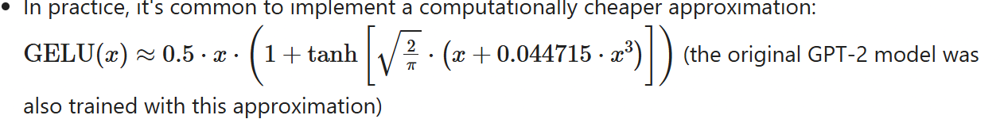

In [ ]:
class GELU(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return 0.5 * x * (1 + torch.tanh(
            torch.sqrt(torch.tensor(2.0 / torch.pi)) *
            (x + 0.044715 * torch.pow(x, 3))
        ))

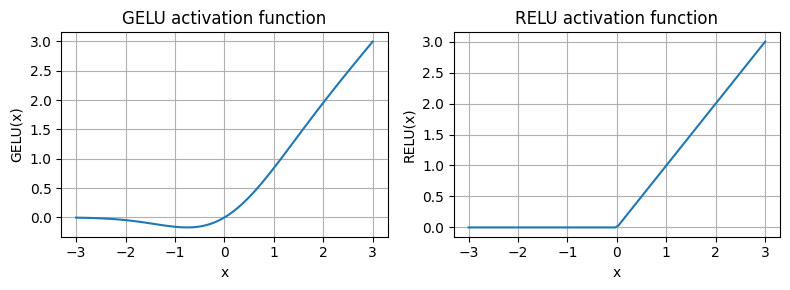

In [ ]:
import matplotlib.pyplot as plt

gelu = GELU()
relu = nn.ReLU()

# sample data 
x = torch.linspace(-3, 3, 100)
# torch.linspace is an pytorch funciton 
# which generates a one dimensional tensor 
# with a specified number of evenly spaced values 
# between a given start and end point 

y_gelu = gelu(x) 
y_relu = relu(x)

plt.figure(figsize=(8,3))
# Loop through activation funciton along with the corresponding labels ("GELU" and "RELU") for plotting
# zip([y_gelu, y_relu], ["GELU", "RELU"]) pairs the activation funciton data (y_gelu with "GELU" and y_relu with "ReLU")
# enumerate(..., 1) -> assigns an index(i) to each pair, starting from 1
for i ,(y, label) in enumerate(zip([y_gelu, y_relu], ["GELU", "RELU"]), 1):
    plt.subplot(1,2, i) #creates a 1-row 2-column grid of subplots and activate the i-th plot
    plt.plot(x, y)      #plots the activation curve
    plt.title(f"{label} activation function")
    plt.xlabel("x")
    plt.ylabel(f"{label}(x)")
    plt.grid(True)

plt.tight_layout() # ensures that subplots titles and labels don't overlap
plt.show()

GELU is a smooth, non linear function that approximates the ReLU but with a non-zero gradient for negative values (except at approximately -0.75)

Implementing the small neural network module, FeedForward, that we will be using in the LLMs transformer block later:

In [ ]:
class FeedForward(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg["emb_dim"], 4 * cfg["emb_dim"]),
            GELU(),
            nn.Linear(4 * cfg["emb_dim"], cfg["emb_dim"])
        )

    def forward(self, x):
        return self.layers(x)


In [ ]:
print(GPT_CONFIG_124M["emb_dim"])

768


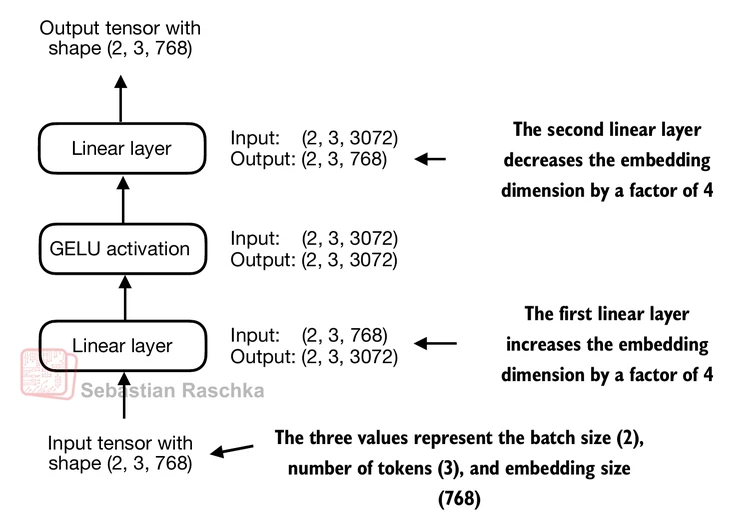

In [ ]:
ffn = FeedForward(GPT_CONFIG_124M) 

# input shape: [batch_size, num_token, emb_dim]
x = torch.rand(2,3,768)
out = ffn(x)
print(out.shape)

torch.Size([2, 3, 768])


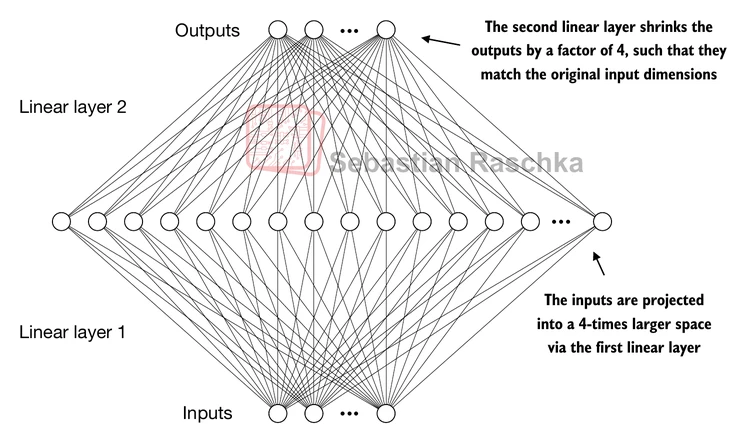

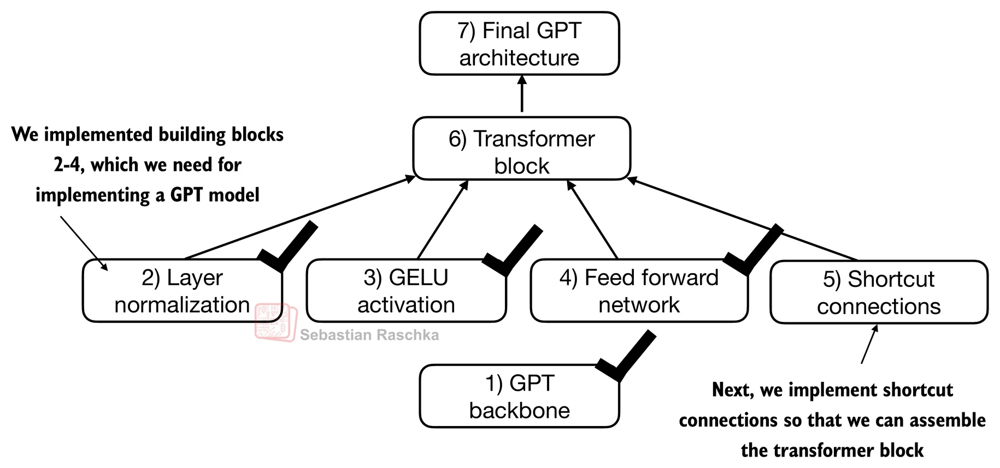

ADDING SHORTCUT CONNECTIONS 

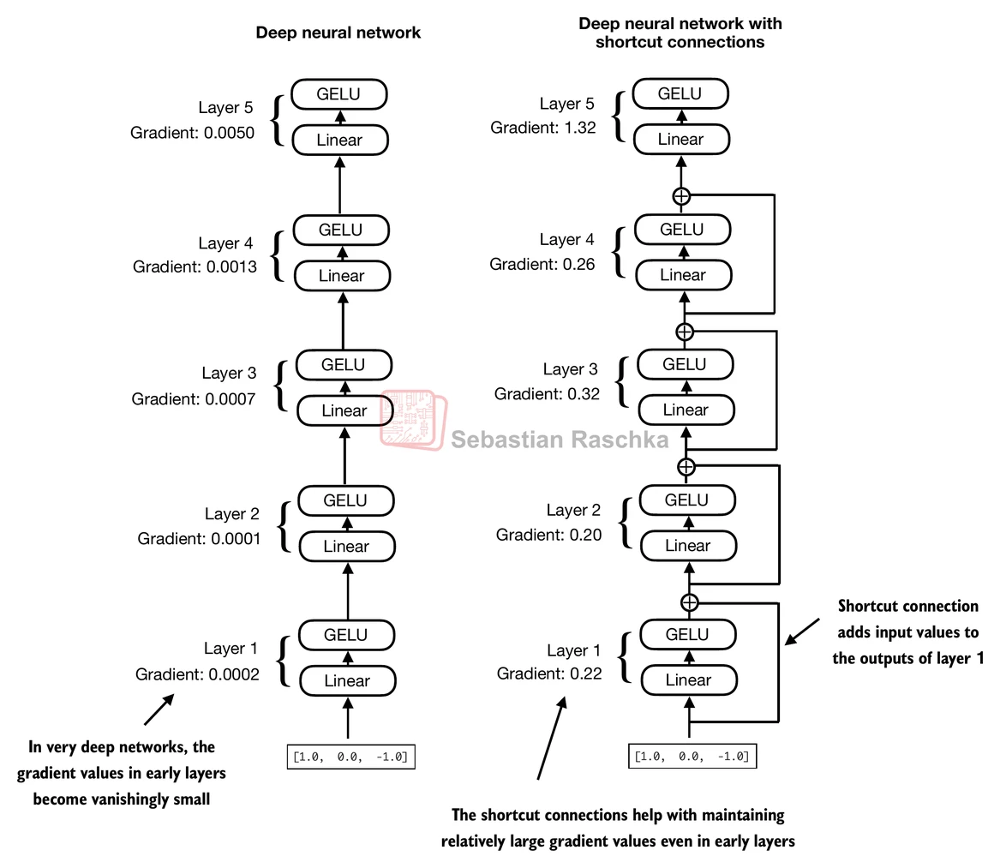

A shortcut connection createse an alternative shorter path for the gradient to flow through the network 

this is achieved by adding the outputof one layer to the output of the later layer, usually skipping one or more layers in between 

they play a crucial role in preserving the flow of gradients during the backward pass in the training.
which reduces the chances of having vanishing gradient problem  

In [ ]:
## Neural Network to illusterate shortcut connections

class ExampleDeepNeuralNetwork(nn.Module):
    def __init__(self, layer_sizes, use_shortcut):
        super().__init__()
        self.use_shortcut = use_shortcut
        self.layers = nn.ModuleList([
            nn.Sequential(nn.Linear(layer_sizes[0], layer_sizes[1]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[1], layer_sizes[2]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[2], layer_sizes[3]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[3], layer_sizes[4]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[4], layer_sizes[5]), GELU())
        ])

    def forward(self, x):
        for layers in self.layers:
            # compute output of the current layer 
            layer_output = layers(x)
            #check if shortcut can be applied 
            if self.use_shortcut and x.shape == layer_output.shape:
            # if use_shortcut is True (and) input x and layer output have same shape  (so they can be added elementwise) 
                x = x + layer_output
            else:
                x = layer_output
        return x 
    
def print_gradients(model, x):
    output = model(x)
    target = torch.tensor([[0.]])
    loss = nn.MSELoss()(output, target)
    loss.backward()

    for name, param in model.named_parameters():
        if 'weight' in name:
            print(f"{name} has gradient mean of {param.grad.abs().mean().item()}")
    # This iterates over all parameters in the model
    # returning their names and values 
    # for each parameter it will check if 'weight' is part of its name (to focus only on weight parameters)
    # the gradient of the parameter (param.grad) is accessed and its absolute values are computed using .abs()
    # the mean of these absolute values are calculated .mean()
    # this mean value is printed alongside the parameters's name 

def print_gradients():

this function is useful for debugging or analyzing how the graidnets are distributed across different layer's weights in neural network

By printing the mean of the absolute gradient, we can:

* check if the gradients are flowing properly through the network during backpropagation

* Identify potential issues such as vanishing and exlpoding gradient problem 

In [ ]:
layer_sizes = [3,3,3,3,3,1]
sample_input = torch.tensor([[1., 0., -1.]]) # Nested List representing 2D Aarray with one row and 3 columns 


# Printing the gradient values without shortcut connections 
torch.manual_seed(123)
model_without_shortcut = ExampleDeepNeuralNetwork(
    layer_sizes, use_shortcut=False
)
print_gradients(model_without_shortcut, sample_input)

layers.0.0.weight has gradient mean of 0.00020173587836325169
layers.1.0.weight has gradient mean of 0.0001201116101583466
layers.2.0.weight has gradient mean of 0.0007152041653171182
layers.3.0.weight has gradient mean of 0.001398873864673078
layers.4.0.weight has gradient mean of 0.005049646366387606


In [ ]:
# Printing the gradient values with the shortcut connections

torch.manual_seed(123)
model_with_shortcut = ExampleDeepNeuralNetwork(
    layer_sizes, use_shortcut=True
)
print_gradients(model_with_shortcut, sample_input)

layers.0.0.weight has gradient mean of 0.22169792652130127
layers.1.0.weight has gradient mean of 0.20694106817245483
layers.2.0.weight has gradient mean of 0.32896995544433594
layers.3.0.weight has gradient mean of 0.2665732502937317
layers.4.0.weight has gradient mean of 1.3258541822433472


As we can see based on the output above, shortcut connections prevent the gradients from vanishing in the early layers 

CONNECTING ATTENTION AND LINEAR LAYERS IN A TRANSFORMER BLOCK

In [ ]:
print(GPT_CONFIG_124M)

{'vocab_size': 50257, 'context_length': 1024, 'emb_dim': 768, 'n_heads': 12, 'n_layers': 12, 'drop_rate': 0.1, 'qkv_bias': False}


In [ ]:
## Implementing an Transformer Block 

class TransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.att = MultiHeadAttention(
            d_in = cfg["emb_dim"],
            d_out = cfg["emb_dim"],
            context_length = cfg["context_length"],
            num_heads = cfg["n_heads"],
            dropout = cfg["drop_rate"],
            qkv_bias = cfg["qkv_bias"]
        )
        self.ff = FeedForward(cfg)
        self.norm1 = LayerNorm(cfg["emb_dim"])
        self.norm2 = LayerNorm(cfg["emb_dim"])
        self.drop_shortcut = nn.Dropout(cfg["drop_rate"])

    def forward(self, x):
        # Shortcut Connection for attention block
        shortcut = x
        x = self.norm1(x)
        x = self.att(x) # Shape [batch_size, num_tokens, emb_dim]
        x = self.drop_shortcut(x)
        x = x + shortcut #add the original input back 

        #shortcut Connection for feed forward block
        shortcut = x
        x = self.norm2(x)
        x = self.ff(x)
        x = self.drop_shortcut(x)
        x = x + shortcut # add the original input back 

        return x 

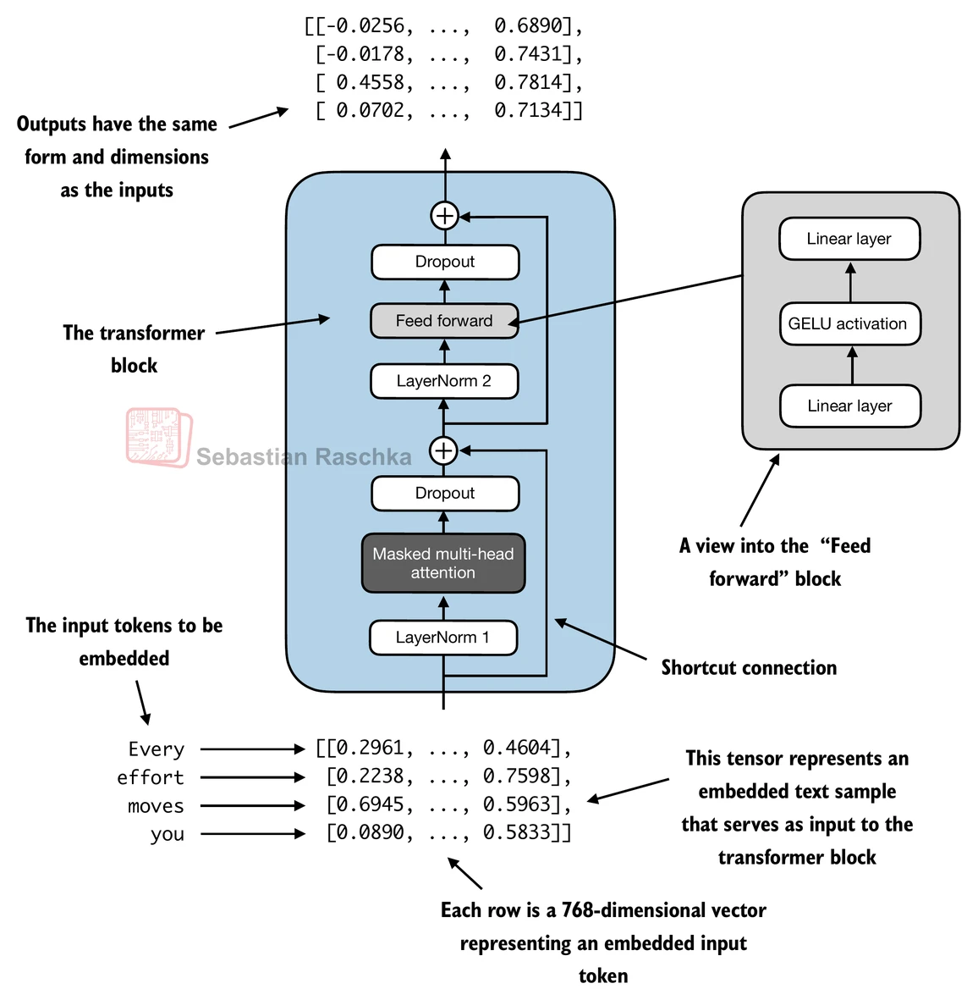

In [ ]:
torch.manual_seed(123)

x = torch.rand(2, 4, 768) # Shape: [batch_size, num_tokens, emb_dim]
block = TransformerBlock(GPT_CONFIG_124M)
output = block(x)

print("Input shape: \n", x.shape)
print("Output shape: \n", output.shape)

Input shape: 
 torch.Size([2, 4, 768])
Output shape: 
 torch.Size([2, 4, 768])


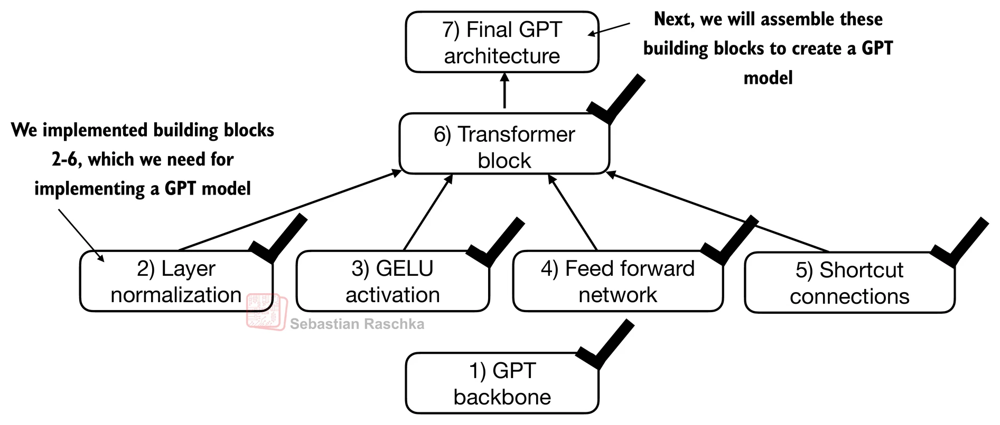

CODING THE GPT MODEL 

Pluging the trasnformer block into the architecture DummyGPTModel 

trasformer blocj is repeated multiple times, In the smallest 124M GPT-2 model we repeat it 12 times

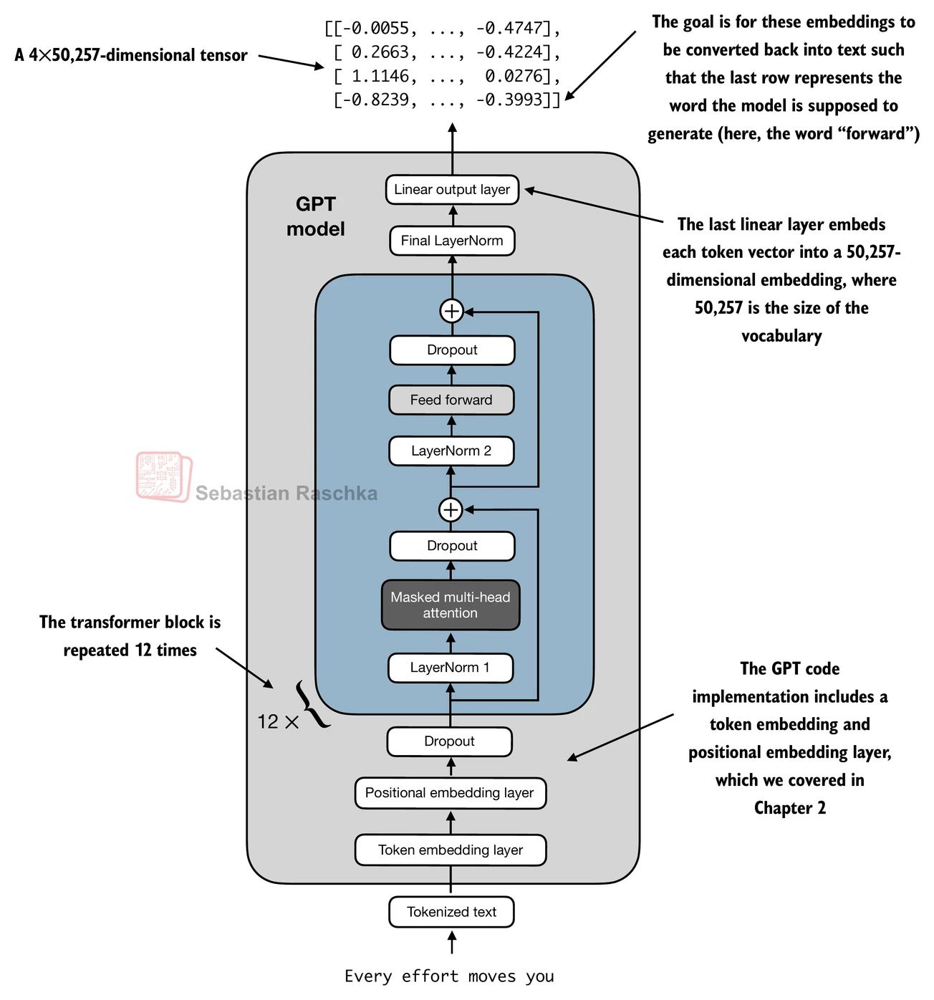

In [ ]:
print(GPT_CONFIG_124M)
# n_layers = 12

{'vocab_size': 50257, 'context_length': 1024, 'emb_dim': 768, 'n_heads': 12, 'n_layers': 12, 'drop_rate': 0.1, 'qkv_bias': False}


In [ ]:
class GPTModel(nn.Module):
    def __init__(self, cfg):
        super().__init__()

        self.tok_emb = nn.Embedding(cfg["vocab_size"], cfg["emb_dim"])
        self.pos_emb = nn.Embedding(cfg["context_length"], cfg["emb_dim"])
        self.drop_emb = nn.Dropout(cfg["drop_rate"])

        self.trf_blocks = nn.Sequential(
            *[TransformerBlock(cfg) for _ in range (cfg["n_layers"])]
        )
        self.final_norm = nn.LayerNorm(cfg["emb_dim"])
        self.out_head = nn.Linear(cfg["emb_dim"], cfg["vocab_size"], bias=False)

    def forward(self, in_idx):
        batch_size, seq_len = in_idx.shape
        tok_embeds = self.tok_emb(in_idx)
        pos_embeds = self.pos_emb(torch.arange(seq_len, device=in_idx.device))
        x  = tok_embeds + pos_embeds #Shape [batch_size, num_tokens, emb_size]
        x = self.drop_emb(x)
        x = self.trf_blocks(x)
        x = self.final_norm(x)
        logits = self.out_head(x)
        return logits

using the configuration of the 124M parameter model, we can instansitate this GPT model random initial weigts as follows:


In [ ]:
torch.manual_seed(123)
model = GPTModel(GPT_CONFIG_124M)

out = model(batch)
print("Input Batch: \n", batch)
print("Output shape: [batch_size, num_tokens, emb_size] \n", out.shape) 
print(out)

Input Batch: 
 tensor([[6109, 3626, 6100,  345],
        [6109, 1110, 6622,  257]])
Output shape: [batch_size, num_tokens, emb_size] 
 torch.Size([2, 4, 50257])
tensor([[[ 0.1381,  0.0077, -0.1963,  ..., -0.0222, -0.1060,  0.1717],
         [ 0.3865, -0.8408, -0.6564,  ..., -0.5163,  0.2369, -0.3357],
         [ 0.6989, -0.1829, -0.1631,  ...,  0.1472, -0.6504, -0.0056],
         [-0.4290,  0.1669, -0.1258,  ...,  1.1579,  0.5303, -0.5549]],

        [[ 0.1094, -0.2894, -0.1467,  ..., -0.0557,  0.2911, -0.2824],
         [ 0.0882, -0.3552, -0.3527,  ...,  1.2930,  0.0053,  0.1898],
         [ 0.6091,  0.4702, -0.4094,  ...,  0.7688,  0.3787, -0.1974],
         [-0.0612, -0.0737,  0.4751,  ...,  1.2463, -0.3834,  0.0609]]],
       grad_fn=<UnsafeViewBackward0>)


In [ ]:
# checking the size of parameter's in this model 

total_param = sum(p.numel() for p in model.parameters())
# model.parameters() -> This returns an iterator over all the
# parameters (weigths and biases) of the model.Each parameter 
# is typically a tensor.
# For each parameter (p), numel() returns the total number
# of elements in the parameter tensor
print(f"Total number of parameters: {total_param:,}")

Total number of parameters: 163,009,536


    In the original GPT-2 paper , the researchers applied weight tying, which means that they reused the token embedding layer(tok_emb) as the output layer, which means setting 

    self.out_head.weight = self.tok_emb.weight

The token embedding layer projects the 50,257-dimensional one-hot encoded input tokens to a 768-dimensional embedding representation
The output layer projects 768-dimensional embeddings back into a 50,257-dimensional representation so that we can convert these back into words (more about that in the next section)
So, the embedding and output layer have the same number of weight parameters, as we can see based on the shape of their weight matrice

In [ ]:
print("Token embedding layer shape: ", model.tok_emb.weight.shape)
print("Output layer shape: ", model.out_head.weight.shape)

Token embedding layer shape:  torch.Size([50257, 768])
Output layer shape:  torch.Size([50257, 768])


in the original GPT-2 paper, the researchers reused the token embedding matrix as an output matrix 

Correspondingly, if we subtracted the number of parametrs of the output layer, we'd get a 124M parameter model:

In [ ]:
total_params_gpt2 = total_param - sum(p.numel() for p in model.out_head.parameters())
print(f"Total Parameters in GPT2 model: {total_params_gpt2:,}")

Total Parameters in GPT2 model: 124,412,160


Lastly we can calculate the memory requirements of the model as folows

In [ ]:
# caculate the total size in bytes (assuming float32, 4 bytes per parameter)
total_size_bytes = total_param * 4

# convert to megabytes
total_size_mb = total_size_bytes / (1024 * 1024)

print(f"Total size of the model: {total_size_mb:.2f} MB")

Total size of the model: 621.83 MB


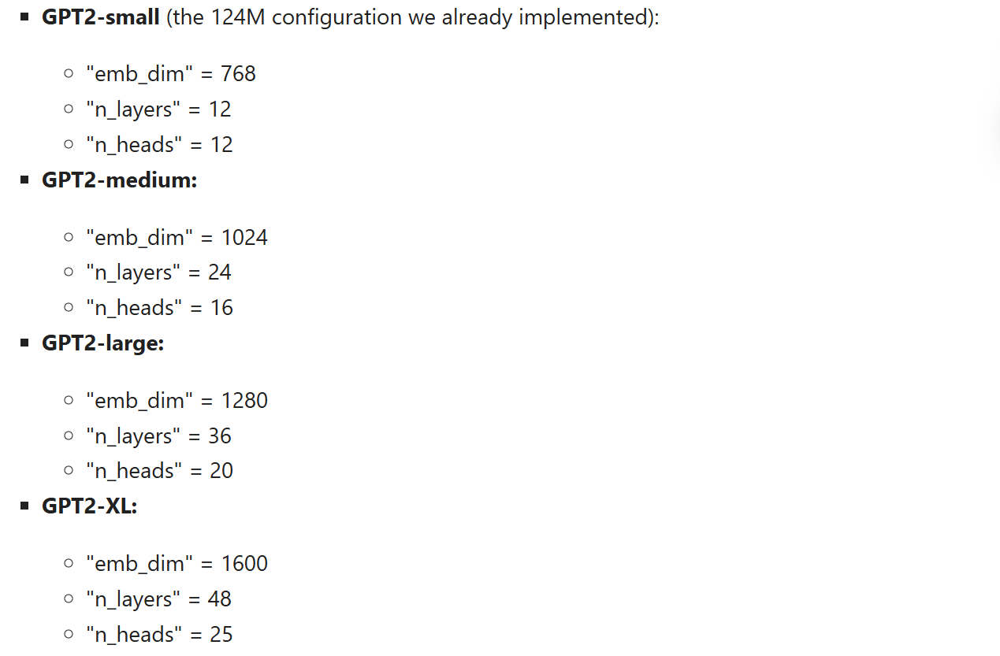

GENERATING TEXT

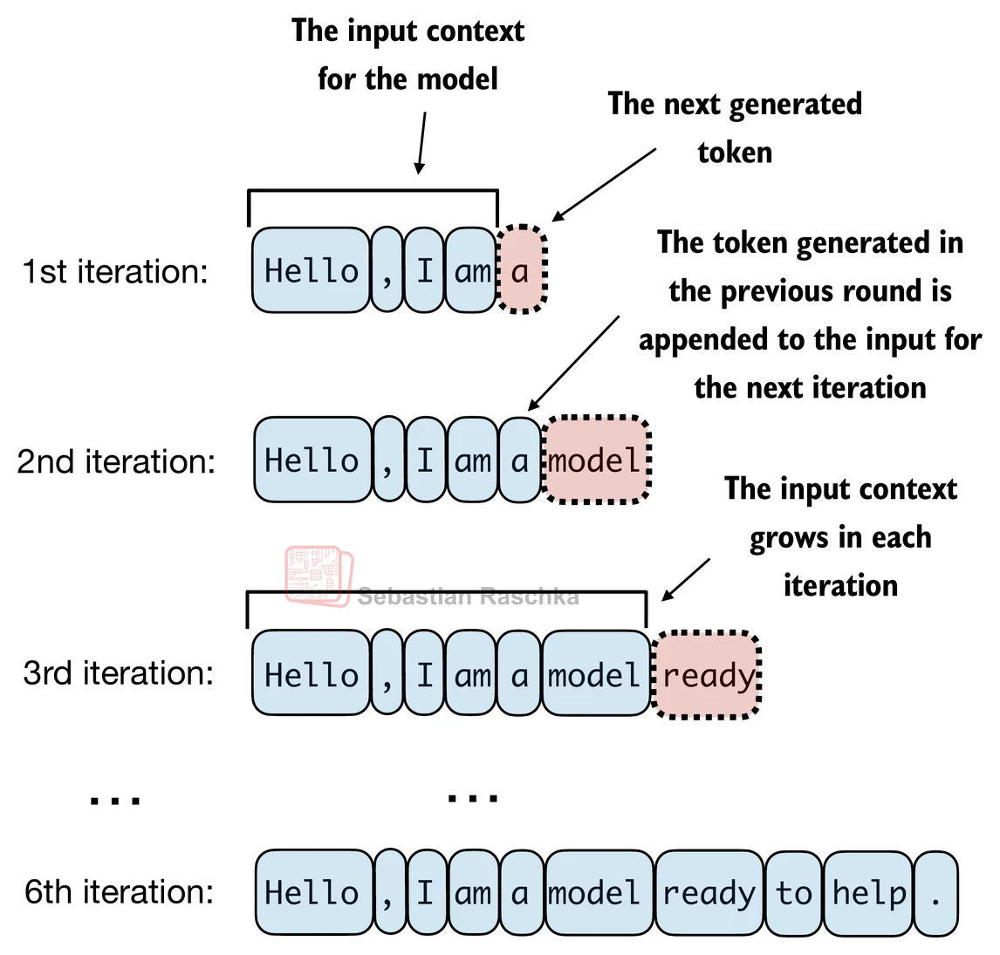

The following generate_text_simple function implements greedy decoding , which is a simple and fast method to generate text 

in greedy decoding at each step the model chooses the word or token with the highest probability as its next output 

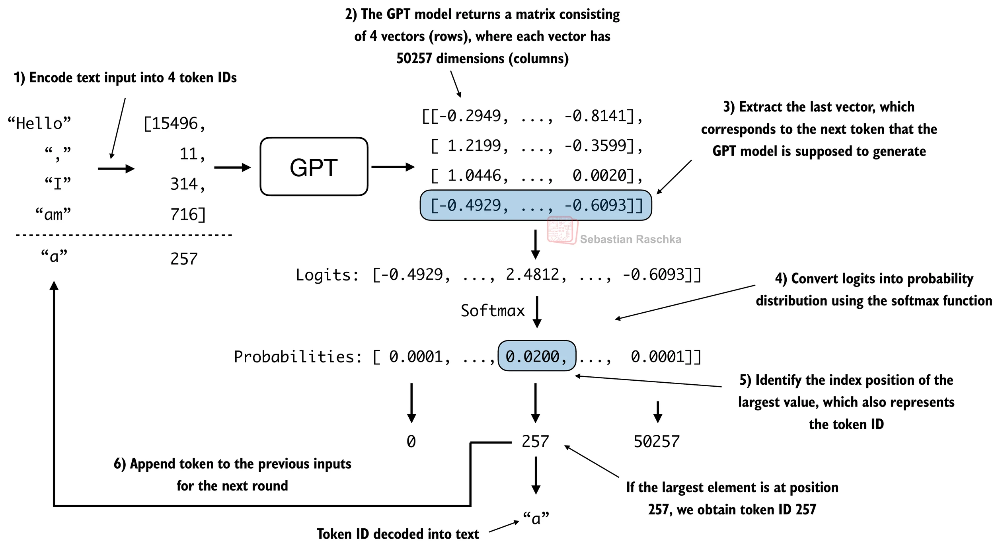

In [ ]:
def generate_text_sample(model, idx, max_new_tokens, context_size):
                                                                    # idx -> a tensor containing the token indices for the current input text, shape = (batch_size, n_tokens)
                                                                    # max_new_tokens -> number of tokens model generate
                                                                    # context_size -> how many tokens model can see at a time 
    for _ in range (max_new_tokens):
        idx_cond = idx[:, -context_size:]                           # if context_size is 5 and idx contains 10 tokens it will only consider last 5 tokens of idx 
        
        # get the predicitons 
        with torch.no_grad():                                       # torch.no_grad() -> is used because we are not training, just inference (saves memory and computation)
            logits = model(idx_cond)                                # logits shape -> (batch_size, seq_len, voacb_size)

        # focus only on the last time step
        # (batch, n_tokens, vocab_size) becomes (batch, vocab_size)
        logits = logits[:, -1, :]

        # apply softmax to get probablities 
        probas = torch.softmax(logits, dim=-1)                      # (batch, vocab_size)

        # get the index of the higest probablity value vocab entry 
        idx_next = torch.argmax(probas, dim=-1, keepdim=True)       # (batch, 1)

        # Append sampled index to the running sequence 
        idx = torch.cat((idx, idx_next), dim=-1)                    # (batch, num_tokens + 1)

    return idx

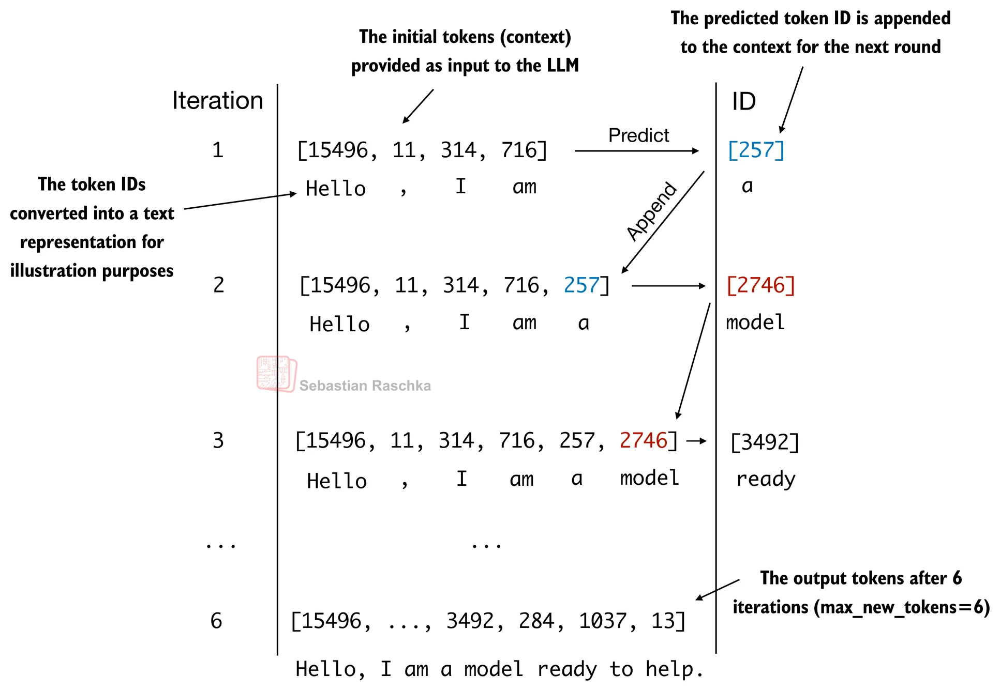

In [ ]:
# lets prepare an input example 

start_context = "Hello, I am"

encoded = tokenizer.encode(start_context)
print("Encoded: ", encoded)

encoded_tensor = torch.tensor(encoded).unsqueeze(0)  
# unsqueeze(0) -> this method adds an additional dimension to tensor at index 0 
# this is often done to create a batch dimension, making the tensor shape compatable for model input 
print("encoded_tensor.shape: ", encoded_tensor.shape)

Encoded:  [15496, 11, 314, 716]
encoded_tensor.shape:  torch.Size([1, 4])


model.eval() -> method that sets a neural network model to evaluation mode. This is crucial for consistent and reliable behaviour during inference, validation or testing, as it alters the behaviour of certain layers within model 

it disables the dropout layer 

In [ ]:
model.eval() # disable dropout 

out = generate_text_sample(
    model = model,
    idx = encoded_tensor,
    max_new_tokens=6,
    context_size=GPT_CONFIG_124M["context_length"]
)

print("Output: ", out)
print("Output Length: ", len(out[0]))

Output:  tensor([[15496,    11,   314,   716, 27018, 24086, 47843, 30961, 42348,  7267]])
Output Length:  10


In [ ]:
# Removing batch dimension and converting back into text:
decoded_text = tokenizer.decode(out.squeeze(0).tolist())
# After removing the the batch dimension, the tensor is converted to a list,
# this is necessary because tokenizer expects a list of token IDs for decoding 
print(decoded_text)

Hello, I am Featureiman Byeswickattribute argue


Here the model is untrained ; hence the random outputs texts above 